# EE782

# Assignment 1

# Shounak Das (21D070068)

https://drive.google.com/drive/folders/1lPgUmkS3LgYAgwGuWRvx_0YXlneSVPhb?usp=drive_link

In [ ]:
# Imports
import pandas as pd
from PIL import Image
import io
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import torch
import torchvision.transforms as transforms
from tqdm import tqdm
import nltk
import json
import os
import re
import warnings
import ast
from nltk.tokenize import word_tokenize
import json
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import pickle
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score

warnings.filterwarnings("ignore")
nltk.download('all')


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     /users/student/rs/ankit/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     /users/student/rs/ankit/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /users/student/rs/ankit/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /users/student/rs/ankit/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /users/student/rs/ankit/nltk_data...
[nltk_data]    |   Package averaged_

True

# (1) Problem & Dataset (Remote-Sensing Captioning)

Data preprocessing and visualization : loading images and captions from CSVs, preparing train/val/test splits, and showing sample images with their captions

100%|██████████| 1093/1093 [00:02<00:00, 534.81it/s]


Loaded 8734 train images.
Loaded 1094 val images.
Loaded 1093 test images.


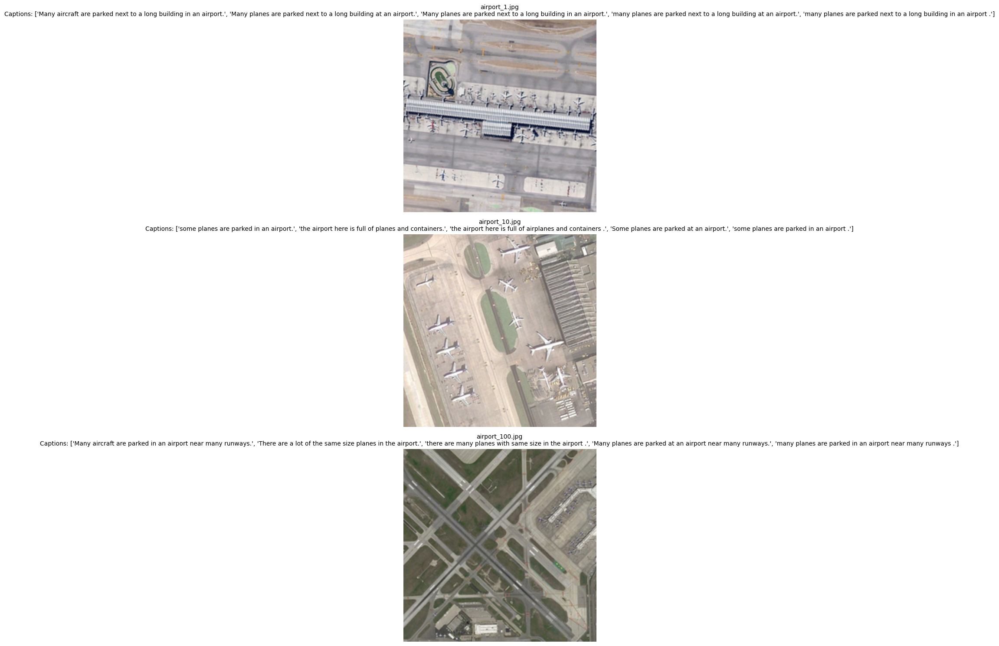

In [ ]:
TRAIN_CSV_PATH = 'train.csv'
VAL_CSV_PATH = 'valid.csv'
TEST_CSV_PATH = 'test.csv'
OUTPUT_DIR = 'preprocessed_data'
os.makedirs(OUTPUT_DIR, exist_ok=True)

MAX_VOCAB_SIZE = 10000
MAX_CAPTION_LENGTH = 24

# Preprocessing and Data Loading
def load_and_decode_data(csv_path):
    df = pd.read_csv(csv_path)
    images, filenames, all_captions_list = [], [], []

    for index, row in tqdm(df.iterrows(), total=len(df)):
        try:
            # Load image
            image_bytes = ast.literal_eval(row['image'])['bytes']
            image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
            images.append(image)
            filenames.append(row['filename'])

            # Load captions
            captions_for_image = re.findall(r"'(.*?)'", row['captions'])
            all_captions_list.append(captions_for_image)

        except Exception as e:
            print(f"Error at row {index}: {e}")
            continue
    return filenames, images, all_captions_list

train_filenames, train_images, train_all_captions = load_and_decode_data(TRAIN_CSV_PATH)
val_filenames, val_images, val_all_captions = load_and_decode_data(VAL_CSV_PATH)
test_filenames, test_images, test_all_captions = load_and_decode_data(TEST_CSV_PATH)

print(f"Loaded {len(train_images)} train images.")
print(f"Loaded {len(val_images)} val images.")
print(f"Loaded {len(test_images)} test images.")

# Display Examples
def show_examples(filenames, images, all_captions, num_examples=3):
    plt.figure(figsize=(15, 5 * num_examples))
    for i in range(min(num_examples, len(images))):
        plt.subplot(num_examples, 1, i + 1)
        plt.imshow(images[i])
        plt.title(f"{filenames[i].split('/')[-1]}\nCaptions: {all_captions[i]}", fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_examples(train_filenames, train_images, train_all_captions)


Image preprocessing and text tokenization : applying transforms, building vocabulary, encoding captions, and showing text statistics

Transformed image shape: torch.Size([3, 224, 224]), min: -2.1179, max: 2.6400


Vocabulary size: 2807


Encoding Captions: 100%|██████████| 1093/1093 [00:00<00:00, 4500.67it/s]



Train Stats: Total Words=504917, OOV=0 (0.00%), Coverage=100.00%, Mean Length=14.00±3.12


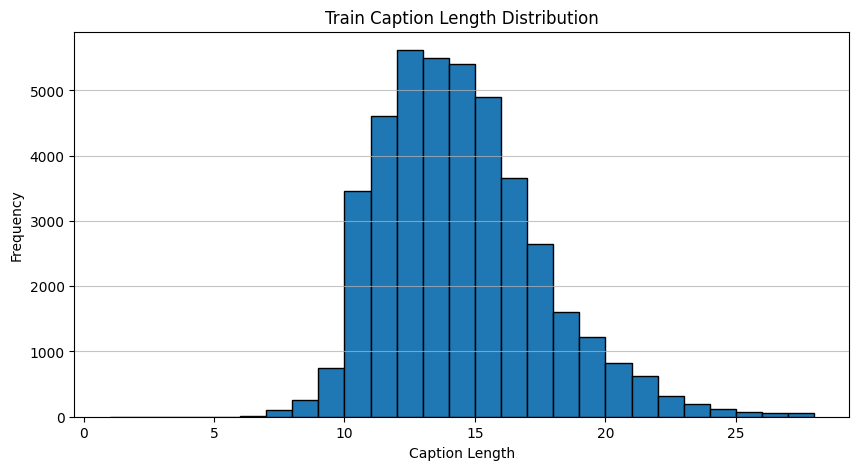


Validation Stats: Total Words=53780, OOV=468 (0.87%), Coverage=99.13%, Mean Length=12.20±3.07


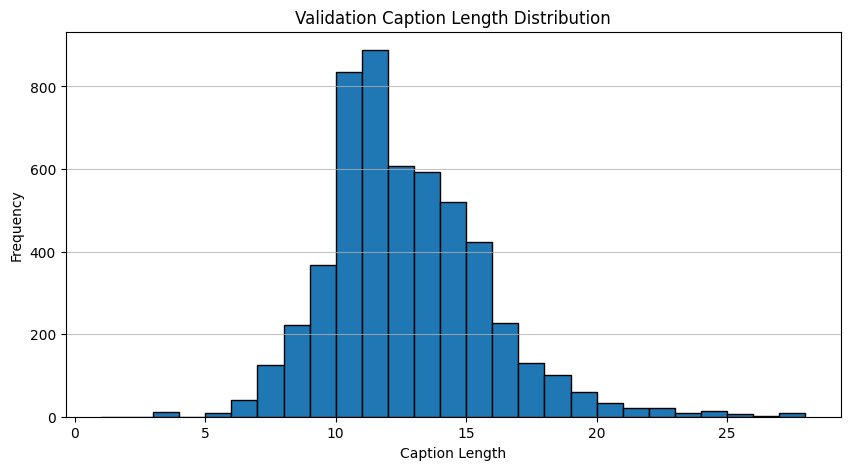


Test Stats: Total Words=65979, OOV=842 (1.28%), Coverage=98.72%, Mean Length=14.46±3.79


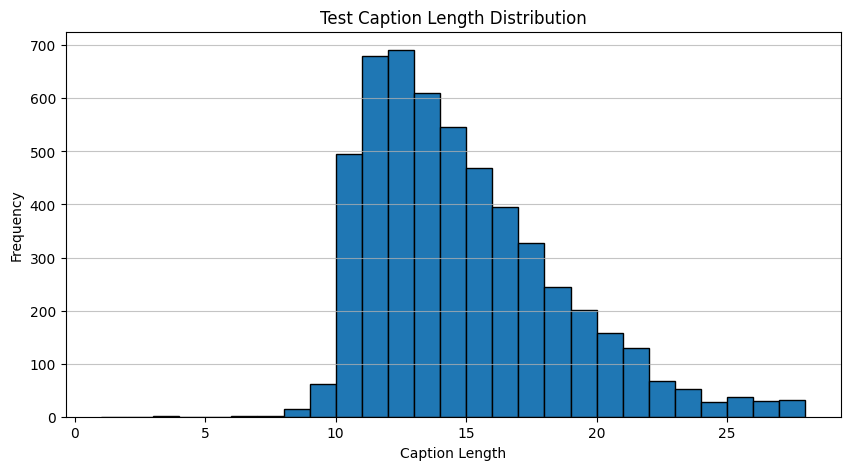

In [ ]:
# Image Preprocessing
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

if train_images:
    transformed_example_image = train_transform(train_images[0])
    print(f"Transformed image shape: {transformed_example_image.shape}, "
          f"min: {transformed_example_image.min():.4f}, max: {transformed_example_image.max():.4f}")

# Tokenize Captions and Build Vocabulary

all_train_words = [word for caps in train_all_captions for cap in caps for word in word_tokenize(cap.lower())]
word_counts = Counter(all_train_words)

PAD_TOKEN, BOS_TOKEN, EOS_TOKEN, UNK_TOKEN = '<pad>', '<bos>', '<eos>', '<unk>'
word_to_idx = {PAD_TOKEN:0, BOS_TOKEN:1, EOS_TOKEN:2, UNK_TOKEN:3}
idx_to_word = {0:PAD_TOKEN, 1:BOS_TOKEN, 2:EOS_TOKEN, 3:UNK_TOKEN}

current_idx = len(word_to_idx)
for word, _ in word_counts.most_common():
    if word not in word_to_idx and current_idx < MAX_VOCAB_SIZE:
        word_to_idx[word] = current_idx
        idx_to_word[current_idx] = word
        current_idx += 1

vocab_size = len(word_to_idx)
print(f"Vocabulary size: {vocab_size}")

# Save vocabulary
with open(os.path.join(OUTPUT_DIR, 'word_to_idx.json'), 'w') as f:
    json.dump(word_to_idx, f)
with open(os.path.join(OUTPUT_DIR, 'idx_to_word.json'), 'w') as f:
    json.dump({str(k): v for k, v in idx_to_word.items()}, f)

# Encode captions
def encode_captions(all_captions, word_to_idx, max_len):
    encoded_list, lengths = [], []
    for caps_per_image in tqdm(all_captions, desc="Encoding Captions"):
        all_encoded = []
        for cap in caps_per_image:
            tokens = word_tokenize(cap.lower())
            encoded = [word_to_idx[BOS_TOKEN]] + [word_to_idx.get(w, word_to_idx[UNK_TOKEN]) for w in tokens] + [word_to_idx[EOS_TOKEN]]
            if len(encoded) > max_len:
                encoded = encoded[:max_len-1] + [word_to_idx[EOS_TOKEN]]
            length = len(encoded)
            lengths.append(length)
            encoded = encoded + [word_to_idx[PAD_TOKEN]]*(max_len - length)
            all_encoded.append(encoded)
        encoded_list.append(all_encoded)
    return encoded_list, lengths

train_encoded_captions, train_caption_lengths = encode_captions(train_all_captions, word_to_idx, MAX_CAPTION_LENGTH)
val_encoded_captions, val_caption_lengths = encode_captions(val_all_captions, word_to_idx, MAX_CAPTION_LENGTH)
test_encoded_captions, test_caption_lengths = encode_captions(test_all_captions, word_to_idx, MAX_CAPTION_LENGTH)

# Text Statistics
def calculate_text_stats(all_captions, word_to_idx, name):
    total_words = oov_words = 0
    lengths = []
    for caps_per_image in all_captions:
        for cap in caps_per_image:
            tokens = word_tokenize(cap.lower())
            lengths.append(len(tokens)+2)
            total_words += len(tokens)
            oov_words += sum(1 for w in tokens if w not in word_to_idx)

    oov_percent = (oov_words/total_words*100) if total_words>0 else 0
    coverage = 100 - oov_percent
    mean_len, std_len = np.mean(lengths), np.std(lengths)

    print(f"\n{name} Stats: Total Words={total_words}, OOV={oov_words} ({oov_percent:.2f}%), "
          f"Coverage={coverage:.2f}%, Mean Length={mean_len:.2f}±{std_len:.2f}")

    plt.figure(figsize=(10,5))
    plt.hist(lengths, bins=range(1, MAX_CAPTION_LENGTH+5), edgecolor='black')
    plt.title(f'{name} Caption Length Distribution')
    plt.xlabel('Caption Length')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.75)
    plt.savefig(os.path.join(OUTPUT_DIR, f'{name}_length_histogram.png'))
    plt.show()

    return {
        'total_words': total_words,
        'oov_words': oov_words,
        'oov_percentage': f"{oov_percent:.2f}%",
        'vocab_coverage': f"{coverage:.2f}%",
        'mean_length': f"{mean_len:.2f}",
        'std_length': f"{std_len:.2f}"
    }

train_stats = calculate_text_stats(train_all_captions, word_to_idx, "Train")
val_stats = calculate_text_stats(val_all_captions, word_to_idx, "Validation")
test_stats = calculate_text_stats(test_all_captions, word_to_idx, "Test")

# Save stats table
stats_df = pd.DataFrame([train_stats, val_stats, test_stats], index=['Train','Validation','Test'])
with open(os.path.join(OUTPUT_DIR,'text_stats_table.md'),'w') as f:
    f.write("# Text Statistics Table\n\n")
    f.write(stats_df.to_markdown())


Loading preprocessed vocabulary mappings and other configs

In [ ]:
# Setting Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

TRAIN_CSV_PATH = 'train.csv'
VAL_CSV_PATH = 'valid.csv'
TEST_CSV_PATH = 'test.csv'
MAX_VOCAB_SIZE = 10000
MAX_CAPTION_LENGTH = 22
BATCH_SIZE = 64

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Load Vocabulary
with open('preprocessed_data/word_to_idx.json', 'r') as f:
    word_to_idx = json.load(f)
with open('preprocessed_data/idx_to_word.json', 'r') as f:
    idx_to_word = {int(k): v for k, v in json.load(f).items()}

vocab_size = len(word_to_idx)
PAD_IDX = word_to_idx['<pad>']
BOS_IDX = word_to_idx['<bos>']
EOS_IDX = word_to_idx['<eos>']
UNK_IDX = word_to_idx['<unk>']


Using device: cuda


Custom dataset for loading images and captions from CSV, applying transforms, and encoding captions

In [ ]:
# Dataset class for CSV data
class CSVCaptionDataset(Dataset):
    def __init__(self, csv_path, transform=None, is_test=False):
        self.df = pd.read_csv(csv_path)
        self.transform = transform
        self.is_test = is_test

        # Precompute caption encodings
        self.encoded_captions = []
        self.caption_lengths = []

        print(f"Processing {csv_path}...")
        for _, row in tqdm(self.df.iterrows(), total=len(self.df)):
            # Parse captions
            captions_str = row['captions']
            try:
                # Try to parse as a list
                captions_list = ast.literal_eval(captions_str)
                if isinstance(captions_list, list) and len(captions_list) > 0:
                    # If it's a list with one element containing multiple captions
                    if len(captions_list) == 1 and isinstance(captions_list[0], str):
                        # Split by single quotes to extract individual captions
                        captions = re.findall(r"'([^']*)'", captions_str)
                    else:
                        captions = [str(cap) for cap in captions_list]
                else:
                    captions = []
            except (ValueError, SyntaxError):
                # Fallback to regex parsing
                captions = re.findall(r"'([^']*)'", captions_str)

            # Encode captions
            encoded_caps = []
            cap_lengths = []
            for caption in captions:
                # Tokenize and encode
                tokens = nltk.word_tokenize(caption.lower())
                encoded = [BOS_IDX] + [word_to_idx.get(word, UNK_IDX) for word in tokens] + [EOS_IDX]

                # Truncate if needed
                if len(encoded) > MAX_CAPTION_LENGTH:
                    encoded = encoded[:MAX_CAPTION_LENGTH-1] + [EOS_IDX]

                cap_lengths.append(len(encoded))

                # Pad if needed
                padded = encoded + [PAD_IDX] * (MAX_CAPTION_LENGTH - len(encoded))
                encoded_caps.append(padded)

            self.encoded_captions.append(encoded_caps)
            self.caption_lengths.append(cap_lengths)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Get image bytes and decode
        image_str = self.df.iloc[idx]['image']

        # Extract bytes from the string representation
        try:
            # Try to parse as a dictionary
            image_dict = ast.literal_eval(image_str)
            image_bytes = image_dict['bytes']
        except (ValueError, SyntaxError, KeyError):
            # Fallback to string extraction
            start_idx = image_str.find("b'") + 2
            end_idx = image_str.rfind("'")
            image_bytes_str = image_str[start_idx:end_idx]
            # Convert string representation to bytes
            image_bytes = eval(f"b'{image_bytes_str}'")

        # Decode image
        image = Image.open(io.BytesIO(image_bytes)).convert('RGB')

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        # Get captions
        if self.is_test:
            # For test set, return all captions
            return image, torch.tensor(self.encoded_captions[idx]), torch.tensor(self.caption_lengths[idx])
        else:
            # For train/val, randomly select one caption
            caption_idx = torch.randint(0, len(self.encoded_captions[idx]), (1,)).item()
            return image, torch.tensor(self.encoded_captions[idx][caption_idx]), torch.tensor(self.caption_lengths[idx][caption_idx])


# (2) Baselines to Implement

CNN encoder class for extracting image features using ResNet18/MobileNet with  feature-cache or fine-tuning

In [ ]:
# CNN Encoder
class CNNEncoder(nn.Module):
    def __init__(self, backbone='resnet18', fine_tune=True):
        super(CNNEncoder, self).__init__()

        if backbone == 'resnet18':
            self.cnn = models.resnet18(pretrained=True)
            self.feature_dim = 512
            self.cnn = nn.Sequential(*list(self.cnn.children())[:-1])
            if fine_tune:
                for param in self.cnn.parameters():
                    param.requires_grad = False
                for param in list(self.cnn.children())[-1].parameters():  # last conv block
                    param.requires_grad = True
        elif backbone == 'mobilenet':
            self.cnn = models.mobilenet_v2(pretrained=True)
            self.feature_dim = 1280
            self.cnn = nn.Sequential(*list(self.cnn.features))
            if fine_tune:
                for param in self.cnn.parameters():
                    param.requires_grad = False
                for param in list(self.cnn)[-1].parameters():
                    param.requires_grad = True

        else:
            raise ValueError("Backbone must be 'resnet18' or 'mobilenet'")


        # Adaptive average pooling to get fixed size output
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))

        # Freeze parameters if not fine-tuning
        if not fine_tune:
            for param in self.cnn.parameters():
                param.requires_grad = False


    def forward(self, images):
        features = self.cnn(images)  # (batch_size, feature_dim, H, W)
        features = self.adaptive_pool(features)  # (batch_size, feature_dim, 1, 1)
        features = features.view(features.size(0), -1)  # (batch_size, feature_dim)
        return features

LSTM decoder for generating captions from image features using embedding, LSTM layers, and greedy/beam search decoding

In [ ]:
# LSTM Decoder
class LSTMDecoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers, dropout=0.1, feature_dim=512):
        super(LSTMDecoder, self).__init__()

        self.vocab_size = vocab_size
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        # Embedding layer
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=PAD_IDX)
        self.feature_dim=feature_dim
        # LSTM layers
        self.lstm = nn.LSTM(
            embedding_dim,
            hidden_dim,
            num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0
        )

        # Output layer
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)


        self.image_projection_h = nn.Linear(feature_dim, hidden_dim)
        self.image_projection_c = nn.Linear(feature_dim, hidden_dim)


        # Update the LSTMDecoder forward method
    def forward(self, image_features, captions, lengths):
        batch_size = image_features.size(0)

        # Initialize hidden state with image features
        hidden = self.init_hidden(image_features)

        # Embed captions
        embeddings = self.embedding(captions)  # (batch_size, seq_len, embedding_dim)

        # Pack padded sequences
        packed = nn.utils.rnn.pack_padded_sequence(
            embeddings, lengths.cpu(), batch_first=True, enforce_sorted=False
        )

        # LSTM forward pass
        packed_outputs, hidden = self.lstm(packed, hidden)

        # Unpack sequences - use total_length to ensure consistent output size
        outputs, _ = nn.utils.rnn.pad_packed_sequence(
            packed_outputs,
            batch_first=True,
            total_length=MAX_CAPTION_LENGTH-1  # Ensure consistent output length
        )

        # Predict next words
        outputs = self.fc(self.dropout(outputs))  # (batch_size, seq_len, vocab_size)

        return outputs

    def init_hidden(self, image_features):
        batch_size = image_features.size(0)
        h0 = self.image_projection_h(image_features).unsqueeze(0).repeat(self.num_layers, 1, 1)
        c0 = self.image_projection_c(image_features).unsqueeze(0).repeat(self.num_layers, 1, 1)
        return (h0, c0)

    def generate_caption(self, image_features, max_length=MAX_CAPTION_LENGTH, method='beam', beam_size=3):
        if method == 'greedy':
            return self.greedy_search(image_features, max_length)
        elif method == 'beam':
            return self.beam_search(image_features, max_length, beam_size)
        else:
            raise ValueError("Method must be 'greedy' or 'beam'")

    def greedy_search(self, image_features, max_length):
        batch_size = image_features.size(0)

        # Initialize hidden state
        hidden = self.init_hidden(image_features)

        # Start with <bos> token
        input_ids = torch.full((batch_size, 1), BOS_IDX, dtype=torch.long).to(device)
        captions = input_ids

        for t in range(max_length - 1):
            # Embed input
            embeddings = self.embedding(input_ids)  # (batch_size, 1, embedding_dim)

            # LSTM forward pass
            outputs, hidden = self.lstm(embeddings, hidden)

            # Predict next word
            outputs = self.fc(outputs.squeeze(1))  # (batch_size, vocab_size)
            _, predicted = outputs.max(1)  # (batch_size)

            # Append to captions
            captions = torch.cat([captions, predicted.unsqueeze(1)], dim=1)

            # Prepare next input
            input_ids = predicted.unsqueeze(1)

            # Stop if all sequences have generated <eos>
            if (predicted == EOS_IDX).all():
                break

        return captions, None

    def beam_search(self, image_features, max_length, beam_size):
        batch_size = image_features.size(0)

        # Initialize hidden state
        hidden = self.init_hidden(image_features)

        # Start with <bos> token
        sequences = [[[BOS_IDX], 0.0, hidden]]

        for t in range(max_length):
            all_candidates = []

            for seq, score, hidden_state in sequences:
                # Stop if the last token is <eos>
                if seq[-1] == EOS_IDX:
                    all_candidates.append((seq, score, hidden_state))
                    continue

                # Prepare input
                input_id = torch.tensor([seq[-1]]).unsqueeze(0).to(device)

                # Embed input
                embeddings = self.embedding(input_id)  # (1, 1, embedding_dim)

                # LSTM forward pass
                outputs, new_hidden = self.lstm(embeddings, hidden_state)

                # Predict next word
                outputs = self.fc(outputs.squeeze(1))  # (1, vocab_size)
                log_probs = torch.log_softmax(outputs, dim=1)  # (1, vocab_size)

                # Get top k candidates
                topk_scores, topk_ids = log_probs.topk(beam_size, dim=1)

                for i in range(beam_size):
                    candidate_seq = seq + [topk_ids[0, i].item()]
                    candidate_score = (score + topk_scores[0, i].item()) / (len(candidate_seq) )
                    all_candidates.append((candidate_seq, candidate_score, new_hidden))

            # Select top k sequences
            ordered = sorted(all_candidates, key=lambda x: x[1], reverse=True)
            sequences = ordered[:beam_size]

        # Return the sequence with the highest score
        best_seq = sequences[0][0]
        return torch.tensor(best_seq).unsqueeze(0), None

Transformer decoder for generating captions using embeddings, positional encoding, and multi-layer Transformer with greedy/beam search decoding

In [ ]:
# Transformer Decoder
class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, num_layers, num_heads, dropout=0.1, num_mem_tokens=4, feature_dim=512):
        super(TransformerDecoder, self).__init__()

        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim

        # Embedding layer
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=PAD_IDX)
        self.num_mem_tokens = num_mem_tokens
        self.feature_dim= feature_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=PAD_IDX)

        # Positional encoding
        self.positional_encoding = nn.Parameter(torch.randn(MAX_CAPTION_LENGTH, embedding_dim))

        # Transformer decoder
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=embedding_dim,
            nhead=num_heads,
            dim_feedforward=embedding_dim * 4,
            dropout=dropout,
            activation='relu'
        )
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_layers)

        # Image feature projection
        self.image_projection = nn.Linear( feature_dim, embedding_dim * num_mem_tokens)
        self.mem_norm = nn.LayerNorm(embedding_dim)

        # Output layer
        self.fc = nn.Linear(embedding_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, image_features, captions, caption_lengths):
        batch_size = image_features.size(0)
        seq_len = captions.size(1)

        # Project image features to memory
        memory = self._prepare_memory(image_features)   # (num_mem_tokens, B, emb)


        # Embed captions
        embeddings = self.embedding(captions)  # (batch_size, seq_len, embedding_dim)

        # Add positional encoding
        embeddings = embeddings + self.positional_encoding[:seq_len, :].unsqueeze(0)

        # Prepare target (captions)
        target = embeddings.transpose(0, 1)  # (seq_len, batch_size, embedding_dim)

        # Create masks
        tgt_mask = self.generate_square_subsequent_mask(seq_len).to(device)
        tgt_key_padding_mask = self.create_padding_mask(captions, caption_lengths).to(device)

        # Transformer forward pass
        output = self.transformer_decoder(
            target, memory,
            tgt_mask=tgt_mask,
            tgt_key_padding_mask=tgt_key_padding_mask
        )  # (seq_len, batch_size, embedding_dim)

        output = output.transpose(0, 1)  # (batch_size, seq_len, embedding_dim)

        # Predict next words
        output = self.fc(self.dropout(output))  # (batch_size, seq_len, vocab_size)

        return output

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def create_padding_mask(self, captions, lengths):
        batch_size, seq_len = captions.size()
        mask = torch.ones(batch_size, seq_len).bool()
        for i, length in enumerate(lengths):
            mask[i, :length] = False
        return mask

    def generate_caption(self, image_features, max_length=MAX_CAPTION_LENGTH, method='greedy', beam_size=3):
        if method == 'greedy':
            return self.greedy_search(image_features, max_length)
        elif method == 'beam':
            return self.beam_search(image_features, max_length, beam_size)
        else:
            raise ValueError("Method must be 'greedy' or 'beam'")

    def greedy_search(self, image_features, max_length):
        batch_size = image_features.size(0)

        memory = self._prepare_memory(image_features)

        # Start with <bos> token
        input_ids = torch.full((batch_size, 1), BOS_IDX, dtype=torch.long).to(device)
        captions = input_ids

        for t in range(max_length - 1):
            # Embed input
            embeddings = self.embedding(captions)  # (batch_size, t+1, embedding_dim)

            # Add positional encoding
            embeddings = embeddings + self.positional_encoding[:t+1, :].unsqueeze(0)

            # Prepare target
            target = embeddings.transpose(0, 1)  # (t+1, batch_size, embedding_dim)

            # Create masks
            tgt_mask = self.generate_square_subsequent_mask(t+1).to(device)

            # Transformer forward pass
            output = self.transformer_decoder(
                target, memory,
                tgt_mask=tgt_mask
            )  # (t+1, batch_size, embedding_dim)

            output = output.transpose(0, 1)  # (batch_size, t+1, embedding_dim)

            # Predict next word (only use the last output)
            output = self.fc(output[:, -1, :])  # (batch_size, vocab_size)
            _, predicted = output.max(1)  # (batch_size)

            # Append to captions
            captions = torch.cat([captions, predicted.unsqueeze(1)], dim=1)

            # Stop if all sequences have generated <eos>
            if (predicted == EOS_IDX).all():
                break

        return captions, None

    def _prepare_memory(self, image_features):
        B = image_features.size(0)
        mem = self.image_projection(image_features)  # (B, num_mem_tokens*emb)
        mem = mem.view(B, self.num_mem_tokens, self.embedding_dim)  # (B, Tm, emb)
        mem = self.mem_norm(mem)
        return mem.transpose(0, 1)  # (Tm, B, emb)

    def beam_search(self, image_features, max_length, beam_size):
        batch_size = image_features.size(0)

        # Prepare memory (image features)
        memory = self._prepare_memory(image_features)

        # Start with <bos> token
        sequences = [[[BOS_IDX], 0.0]]

        for t in range(max_length):
            all_candidates = []

            for seq, score in sequences:
                # Stop if the last token is <eos>
                if seq[-1] == EOS_IDX:
                    all_candidates.append((seq, score))
                    continue

                # Prepare input
                input_ids = torch.tensor(seq).unsqueeze(0).to(device)  # (1, seq_len)

                # Embed input
                embeddings = self.embedding(input_ids)  # (1, seq_len, embedding_dim)

                # Add positional encoding
                embeddings = embeddings + self.positional_encoding[:len(seq), :].unsqueeze(0)

                # Prepare target
                target = embeddings.transpose(0, 1)  # (seq_len, 1, embedding_dim)

                # Create masks
                tgt_mask = self.generate_square_subsequent_mask(len(seq)).to(device)

                # Transformer forward pass
                output = self.transformer_decoder(
                    target, memory,
                    tgt_mask=tgt_mask
                )  # (seq_len, 1, embedding_dim)

                output = output.transpose(0, 1)  # (1, seq_len, embedding_dim)

                # Predict next word (only use the last output)
                output = self.fc(output[:, -1, :])  # (1, vocab_size)
                log_probs = torch.log_softmax(output, dim=1)  # (1, vocab_size)

                # Get top k candidates
                topk_scores, topk_ids = log_probs.topk(beam_size, dim=1)

                for i in range(beam_size):
                    candidate_seq = seq + [topk_ids[0, i].item()]
                    candidate_score = score + topk_scores[0, i].item()
                    all_candidates.append((candidate_seq, candidate_score))

            # Select top k sequences
            ordered = sorted(all_candidates, key=lambda x: x[1], reverse=True)
            sequences = ordered[:beam_size]

        # Return the sequence with the highest score
        best_seq = sequences[0][0]
        return torch.tensor(best_seq).unsqueeze(0), None

Image captioning class : combines CNN encoder and text decoder to train and generate captions from images

In [ ]:
# Image Captioning Model
class ImageCaptioningModel(nn.Module):
    def __init__(self, encoder, decoder):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, images, captions, lengths):
        # Encode images
        image_features = self.encoder(images)

        # Decode captions
        outputs = self.decoder(image_features, captions, lengths)

        return outputs

    def generate_caption(self, images, max_length=MAX_CAPTION_LENGTH, method='greedy', beam_size=3):
        # Encode images
        image_features = self.encoder(images)

        # Generate captions
        captions, attentions = self.decoder.generate_caption(
            image_features, max_length, method, beam_size
        )

        return captions, attentions

Training function with lr scheduling

In [ ]:
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX, reduction="none")

def train_model(model, dataloader, criterion, optimizer, scheduler=None):
    model.train()
    total_loss = 0
    progress_bar = tqdm(dataloader, desc="Training")

    for batch_idx, (images, captions, lengths) in enumerate(progress_bar):
        images = images.to(device)
        captions = captions.to(device)

        # Forward pass
        outputs = model(images, captions[:, :-1], lengths - 1)

        # Calculate loss
        loss = criterion(
            outputs.contiguous().view(-1, outputs.size(-1)),
            captions[:, 1:].contiguous().view(-1)
        )

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})

    if scheduler:
        scheduler.step()

    return total_loss / len(dataloader)

Evaluation function which returns val loss, BLEU-4, METEOR, caption length stats, and repetition percentage

In [ ]:
def evaluate_model(model, dataloader, criterion):
    model.eval()
    total_loss = 0
    all_references = []
    all_hypotheses = []

    with torch.no_grad():
        for images, captions, lengths in tqdm(dataloader, desc="Evaluation"):
            images = images.to(device)
            captions = captions.to(device)

            # Forward pass
            outputs = model(images, captions[:, :-1], lengths - 1)

            # Calculate loss
            loss = criterion(
                outputs.contiguous().view(-1, outputs.size(-1)),
                captions[:, 1:].contiguous().view(-1)
            )
            total_loss += loss.item()

            # Generate captions
            generated_captions, _ = model.generate_caption(images)

            # Convert to words
            for i in range(len(generated_captions)):
                # Convert generated caption to words
                gen_caption = generated_captions[i].cpu().numpy()
                gen_words = [idx_to_word.get(idx, '<unk>') for idx in gen_caption if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                all_hypotheses.append(gen_words)

                # Convert reference caption to words
                ref_caption = captions[i].cpu().numpy()
                ref_words = [idx_to_word.get(idx, '<unk>') for idx in ref_caption if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                all_references.append([ref_words])

    # Calculate metrics
    bleu4 = corpus_bleu(all_references, all_hypotheses, weights=(0.25, 0.25, 0.25, 0.25))

    # Calculate METEOR scores
    meteor_scores = []
    for ref, hyp in zip(all_references, all_hypotheses):
        # meteor_scores.append(meteor_score([' '.join(ref[0])], ' '.join(hyp)))
        meteor_scores.append(meteor_score(ref, hyp))

    meteor_avg = np.mean(meteor_scores)

    # Calculate caption statistics
    caption_lengths = [len(hyp) for hyp in all_hypotheses]
    mean_length = np.mean(caption_lengths)
    std_length = np.std(caption_lengths)

    # Calculate degenerate repetitions
    degenerate_count = 0
    for hyp in all_hypotheses:
        for i in range(len(hyp) - 2):
            if hyp[i] == hyp[i+1] == hyp[i+2]:
                degenerate_count += 1
                break
    degenerate_percentage = (degenerate_count / len(all_hypotheses)) * 100

    return {
        'loss': total_loss / len(dataloader),
        'bleu4': bleu4,
        'meteor': meteor_avg,
        'mean_length': mean_length,
        'std_length': std_length,
        'degenerate_percentage': degenerate_percentage
    }


Dataset and dataloaders  for training, validation, and test splits

In [ ]:
train_dataset = CSVCaptionDataset(TRAIN_CSV_PATH, transform=train_transform)
val_dataset = CSVCaptionDataset(VAL_CSV_PATH, transform=val_test_transform)
test_dataset = CSVCaptionDataset(TEST_CSV_PATH, transform=val_test_transform, is_test=True)

# Create dataloaders
train_dataloader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=4
    )

val_dataloader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=4
    )

test_dataloader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=4
    )


Processing train.csv...


100%|██████████| 8734/8734 [00:02<00:00, 3606.61it/s]


Processing valid.csv...


100%|██████████| 1094/1094 [00:00<00:00, 3379.66it/s]


Processing test.csv...


100%|██████████| 1093/1093 [00:00<00:00, 3290.45it/s]


# Resnet18 + LSTM with feature cache (frozen CNN)

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]


{'loss': 3.5328716304567127, 'bleu4': 0.06526656735330769, 'meteor': 0.24337658794553474, 'mean_length': 8.04774444698878, 'std_length': 0.3331007334870464, 'degenerate_percentage': 4.3164643920311425}
Train Loss: 4.4502
Val Loss: 3.5329
BLEU-4: 0.0653
Caption Length: 8.05 ± 0.33
Degenerate Repetitions: 4.32%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]


{'loss': 2.7091039286719427, 'bleu4': 0.08612635744044266, 'meteor': 0.2818655912335462, 'mean_length': 13.486718571101443, 'std_length': 0.9987374302457191, 'degenerate_percentage': 99.24433249370277}
Train Loss: 3.0394
Val Loss: 2.7091
BLEU-4: 0.0861
Caption Length: 13.49 ± 1.00
Degenerate Repetitions: 99.24%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]


{'loss': 2.3558812538782754, 'bleu4': 0.11253639405819438, 'meteor': 0.3159428853136534, 'mean_length': 13.362376917792535, 'std_length': 0.8387291420692364, 'degenerate_percentage': 73.67758186397985}
Train Loss: 2.4694
Val Loss: 2.3559
BLEU-4: 0.1125
Caption Length: 13.36 ± 0.84
Degenerate Repetitions: 73.68%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:10<00:00,  1.80it/s]


{'loss': 2.1576717694600425, 'bleu4': 0.13419775594222175, 'meteor': 0.3432439176035206, 'mean_length': 12.594000457980307, 'std_length': 1.5946701653042668, 'degenerate_percentage': 4.682848637508587}
Train Loss: 2.2142
Val Loss: 2.1577
BLEU-4: 0.1342
Caption Length: 12.59 ± 1.59
Degenerate Repetitions: 4.68%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.93it/s]


{'loss': 2.03885735405816, 'bleu4': 0.15333179771883787, 'meteor': 0.35281544183642294, 'mean_length': 11.990153423402793, 'std_length': 1.9303522506496966, 'degenerate_percentage': 0.0}
Train Loss: 2.0282
Val Loss: 2.0389
BLEU-4: 0.1533
Caption Length: 11.99 ± 1.93
Degenerate Repetitions: 0.00%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.83it/s]


{'loss': 1.9537723726696439, 'bleu4': 0.15793794718631055, 'meteor': 0.36174973972150865, 'mean_length': 12.027020838103962, 'std_length': 2.175482782217161, 'degenerate_percentage': 0.0}
Train Loss: 1.9490
Val Loss: 1.9538
BLEU-4: 0.1579
Caption Length: 12.03 ± 2.18
Degenerate Repetitions: 0.00%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]


{'loss': 1.9488179485003154, 'bleu4': 0.16161091920154605, 'meteor': 0.36746425923253073, 'mean_length': 11.89374856881154, 'std_length': 2.1162515378713995, 'degenerate_percentage': 0.0}
Train Loss: 1.9318
Val Loss: 1.9488
BLEU-4: 0.1616
Caption Length: 11.89 ± 2.12
Degenerate Repetitions: 0.00%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.92it/s]


{'loss': 1.909105983045366, 'bleu4': 0.1717548231234029, 'meteor': 0.3710715906621544, 'mean_length': 11.395237004808793, 'std_length': 2.333035563710682, 'degenerate_percentage': 0.0}
Train Loss: 1.9019
Val Loss: 1.9091
BLEU-4: 0.1718
Caption Length: 11.40 ± 2.33
Degenerate Repetitions: 0.00%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]


{'loss': 1.907343606154124, 'bleu4': 0.1745497164011869, 'meteor': 0.3793465170328216, 'mean_length': 11.48523013510419, 'std_length': 2.2122748795808387, 'degenerate_percentage': 0.0}
Train Loss: 1.8819
Val Loss: 1.9073
BLEU-4: 0.1745
Caption Length: 11.49 ± 2.21
Degenerate Repetitions: 0.00%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]


{'loss': 1.879148907131619, 'bleu4': 0.17532161826916257, 'meteor': 0.3816370008106188, 'mean_length': 11.519693153194412, 'std_length': 2.2213783398166687, 'degenerate_percentage': 0.0}
Train Loss: 1.8599
Val Loss: 1.8791
BLEU-4: 0.1753
Caption Length: 11.52 ± 2.22
Degenerate Repetitions: 0.00%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


Test Results:
BLEU-4: 0.1759
Caption Length: 11.54 ± 2.24
Degenerate Repetitions: 0.00%


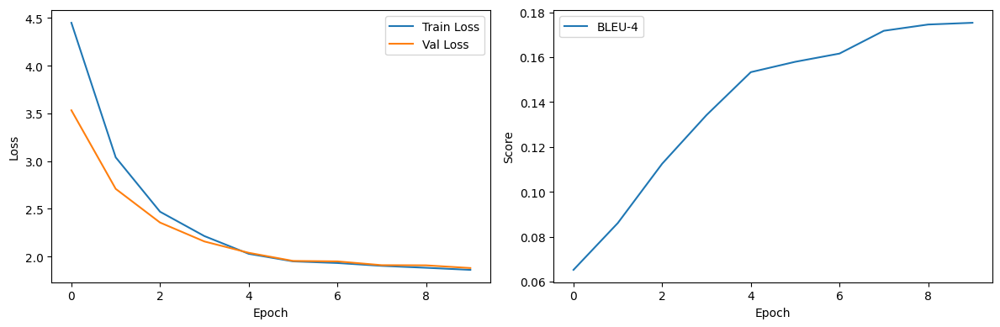

In [ ]:
# Choosing encoder and decoder
backbone = 'resnet18'
decoder_type = 'lstm'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Resnet18 + LSTM with finetuning

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:10<00:00,  1.80it/s]


{'loss': 3.5237716568840876, 'bleu4': 0.06515858663637208, 'meteor': 0.24558389402036535, 'mean_length': 7.879665674376001, 'std_length': 0.4409911167761462, 'degenerate_percentage': 0.0}
Train Loss: 4.4938
Val Loss: 3.5238
BLEU-4: 0.0652
Caption Length: 7.88 ± 0.44
Degenerate Repetitions: 0.00%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.93it/s]


{'loss': 2.659641729460822, 'bleu4': 0.0901668823644495, 'meteor': 0.28809667710582537, 'mean_length': 11.804556904053126, 'std_length': 1.0858172759579756, 'degenerate_percentage': 0.0}
Train Loss: 3.0104
Val Loss: 2.6596
BLEU-4: 0.0902
Caption Length: 11.80 ± 1.09
Degenerate Repetitions: 0.00%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.95it/s]


{'loss': 2.348387552632226, 'bleu4': 0.12017163898442883, 'meteor': 0.3249320688765325, 'mean_length': 12.523356995649188, 'std_length': 1.1422088590661883, 'degenerate_percentage': 0.2518891687657431}
Train Loss: 2.4544
Val Loss: 2.3484
BLEU-4: 0.1202
Caption Length: 12.52 ± 1.14
Degenerate Repetitions: 0.25%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.95it/s]


{'loss': 2.1471724443965488, 'bleu4': 0.14580742466928887, 'meteor': 0.3465491297339556, 'mean_length': 11.510991527364324, 'std_length': 1.6477825032699411, 'degenerate_percentage': 0.0}
Train Loss: 2.2234
Val Loss: 2.1472
BLEU-4: 0.1458
Caption Length: 11.51 ± 1.65
Degenerate Repetitions: 0.00%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 1.9966416160265605, 'bleu4': 0.1560167465799672, 'meteor': 0.3536999331019171, 'mean_length': 11.452828028394778, 'std_length': 2.1238303842880066, 'degenerate_percentage': 0.0}
Train Loss: 2.0404
Val Loss: 1.9966
BLEU-4: 0.1560
Caption Length: 11.45 ± 2.12
Degenerate Repetitions: 0.00%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 1.9363706045680575, 'bleu4': 0.1653683587083323, 'meteor': 0.3684673161125573, 'mean_length': 11.61506755209526, 'std_length': 2.006739763377147, 'degenerate_percentage': 0.0}
Train Loss: 1.9396
Val Loss: 1.9364
BLEU-4: 0.1654
Caption Length: 11.62 ± 2.01
Degenerate Repetitions: 0.00%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]


{'loss': 1.9462915261586506, 'bleu4': 0.16100251841560376, 'meteor': 0.3598136609041482, 'mean_length': 11.666017861231968, 'std_length': 1.9418137132710724, 'degenerate_percentage': 0.0}
Train Loss: 1.9216
Val Loss: 1.9463
BLEU-4: 0.1610
Caption Length: 11.67 ± 1.94
Degenerate Repetitions: 0.00%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 1.9260493318239849, 'bleu4': 0.16763920425192713, 'meteor': 0.3725693562091004, 'mean_length': 11.537554385161439, 'std_length': 2.0553699671946384, 'degenerate_percentage': 0.0}
Train Loss: 1.8914
Val Loss: 1.9260
BLEU-4: 0.1676
Caption Length: 11.54 ± 2.06
Degenerate Repetitions: 0.00%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 1.9096367888980441, 'bleu4': 0.1703550711965407, 'meteor': 0.3735279371279236, 'mean_length': 11.220517517746737, 'std_length': 2.1058894173825036, 'degenerate_percentage': 0.0}
Train Loss: 1.8707
Val Loss: 1.9096
BLEU-4: 0.1704
Caption Length: 11.22 ± 2.11
Degenerate Repetitions: 0.00%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.95it/s]


{'loss': 1.860021021631029, 'bleu4': 0.17019083040921015, 'meteor': 0.3805982921369503, 'mean_length': 11.824135562170827, 'std_length': 2.108567805190997, 'degenerate_percentage': 0.0}
Train Loss: 1.8535
Val Loss: 1.8600
BLEU-4: 0.1702
Caption Length: 11.82 ± 2.11
Degenerate Repetitions: 0.00%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]


Test Results:
BLEU-4: 0.1719
Caption Length: 11.21 ± 2.11
Degenerate Repetitions: 0.00%


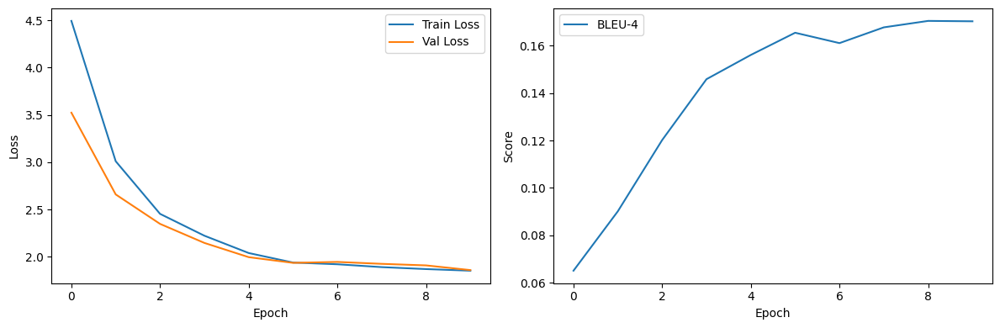

In [ ]:
# Choosing encoder and decoder
backbone = 'resnet18'
decoder_type = 'lstm'
fine_tune_encoder = True

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Mobilenet + LSTM with feature cache (frozen CNN)

Epoch 1/10


Training:  19%|█▉        | 26/137 [00:02<00:05, 18.71it/s, loss=4.58]

Evaluation: 100%|██████████| 18/18 [00:10<00:00,  1.79it/s]


{'loss': 3.5224600897894964, 'bleu4': 0.06083565943304898, 'meteor': 0.23554043013955517, 'mean_length': 8.777078085642318, 'std_length': 1.5181887473813145, 'degenerate_percentage': 35.18433707350584}
Train Loss: 4.4621
Val Loss: 3.5225
BLEU-4: 0.0608
Caption Length: 8.78 ± 1.52
Degenerate Repetitions: 35.18%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]


{'loss': 2.695161329375373, 'bleu4': 0.08916341797211447, 'meteor': 0.295720704044454, 'mean_length': 13.115411037325394, 'std_length': 0.8197852289836167, 'degenerate_percentage': 94.13785207236089}
Train Loss: 3.0355
Val Loss: 2.6952
BLEU-4: 0.0892
Caption Length: 13.12 ± 0.82
Degenerate Repetitions: 94.14%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 2.370457821422153, 'bleu4': 0.11479432617048342, 'meteor': 0.32541922037551846, 'mean_length': 13.520380123654682, 'std_length': 1.2843794021201462, 'degenerate_percentage': 97.30936569727501}
Train Loss: 2.4728
Val Loss: 2.3705
BLEU-4: 0.1148
Caption Length: 13.52 ± 1.28
Degenerate Repetitions: 97.31%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.92it/s]


{'loss': 2.1475507418314614, 'bleu4': 0.13906450915441407, 'meteor': 0.35508268572468404, 'mean_length': 12.967368903137166, 'std_length': 1.5167072059232256, 'degenerate_percentage': 67.86123196702542}
Train Loss: 2.2191
Val Loss: 2.1476
BLEU-4: 0.1391
Caption Length: 12.97 ± 1.52
Degenerate Repetitions: 67.86%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]


{'loss': 1.9842808312839932, 'bleu4': 0.14883674216712595, 'meteor': 0.3673350713590222, 'mean_length': 13.182161667048318, 'std_length': 1.76729507918827, 'degenerate_percentage': 40.565605678955805}
Train Loss: 2.0356
Val Loss: 1.9843
BLEU-4: 0.1488
Caption Length: 13.18 ± 1.77
Degenerate Repetitions: 40.57%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.87it/s]


{'loss': 1.938935226864285, 'bleu4': 0.1621402100716969, 'meteor': 0.37286246694326264, 'mean_length': 12.591367071215938, 'std_length': 1.5646728657087816, 'degenerate_percentage': 38.40164872910465}
Train Loss: 1.9593
Val Loss: 1.9389
BLEU-4: 0.1621
Caption Length: 12.59 ± 1.56
Degenerate Repetitions: 38.40%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.83it/s]


{'loss': 1.9465912183125813, 'bleu4': 0.16868402761064086, 'meteor': 0.38151586377265445, 'mean_length': 12.62457064346233, 'std_length': 1.611441769814598, 'degenerate_percentage': 38.287153652392945}
Train Loss: 1.9208
Val Loss: 1.9466
BLEU-4: 0.1687
Caption Length: 12.62 ± 1.61
Degenerate Repetitions: 38.29%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]


{'loss': 1.9063387645615473, 'bleu4': 0.17223675744613343, 'meteor': 0.38419396301834546, 'mean_length': 12.596404854591253, 'std_length': 1.6751366489972157, 'degenerate_percentage': 19.56720861002977}
Train Loss: 1.8937
Val Loss: 1.9063
BLEU-4: 0.1722
Caption Length: 12.60 ± 1.68
Degenerate Repetitions: 19.57%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.93it/s]


{'loss': 1.8851598103841145, 'bleu4': 0.1814085810502379, 'meteor': 0.389658954156795, 'mean_length': 12.225211815891917, 'std_length': 1.68846923782677, 'degenerate_percentage': 23.563086787268148}
Train Loss: 1.8697
Val Loss: 1.8852
BLEU-4: 0.1814
Caption Length: 12.23 ± 1.69
Degenerate Repetitions: 23.56%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.88it/s]


{'loss': 1.8683437705039978, 'bleu4': 0.18008978467946532, 'meteor': 0.3897299128834738, 'mean_length': 12.320700709869476, 'std_length': 1.7468843445326596, 'degenerate_percentage': 19.395465994962215}
Train Loss: 1.8553
Val Loss: 1.8683
BLEU-4: 0.1801
Caption Length: 12.32 ± 1.75
Degenerate Repetitions: 19.40%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Test Results:
BLEU-4: 0.1812
Caption Length: 12.22 ± 1.69
Degenerate Repetitions: 23.96%


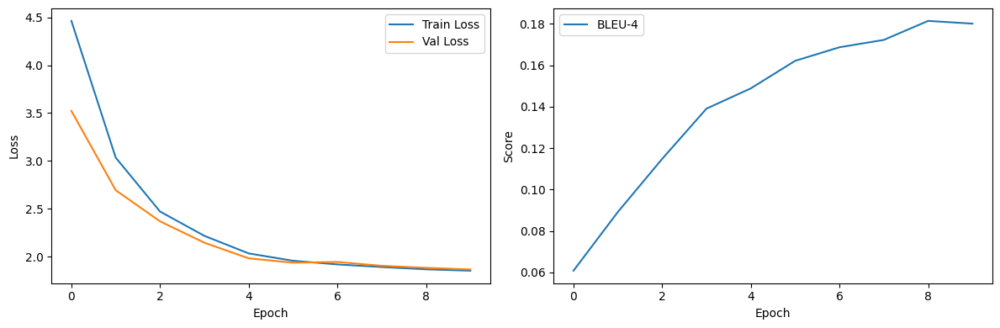

In [ ]:
# Choosing encoder and decoder
backbone = 'mobilenet'
decoder_type = 'lstm'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Mobilenet + LSTM with finetuning

Epoch 1/10


Training:  13%|█▎        | 18/137 [00:01<00:07, 16.23it/s, loss=5.59]

Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.91it/s]


{'loss': 3.574194762441847, 'bleu4': 0.03610901046398432, 'meteor': 0.21309847311390925, 'mean_length': 8.525990382413557, 'std_length': 0.728371065066382, 'degenerate_percentage': 0.0}
Train Loss: 4.4558
Val Loss: 3.5742
BLEU-4: 0.0361
Caption Length: 8.53 ± 0.73
Degenerate Repetitions: 0.00%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.84it/s]


{'loss': 2.7303817537095814, 'bleu4': 0.09851301918703362, 'meteor': 0.2896658092658875, 'mean_length': 10.460155713304328, 'std_length': 1.0183587389559303, 'degenerate_percentage': 5.8163498969544305}
Train Loss: 3.0676
Val Loss: 2.7304
BLEU-4: 0.0985
Caption Length: 10.46 ± 1.02
Degenerate Repetitions: 5.82%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.83it/s]


{'loss': 2.3558022843466864, 'bleu4': 0.14098685287771928, 'meteor': 0.34414662523593553, 'mean_length': 11.17494847721548, 'std_length': 1.6494574028152922, 'degenerate_percentage': 0.0}
Train Loss: 2.4786
Val Loss: 2.3558
BLEU-4: 0.1410
Caption Length: 11.17 ± 1.65
Degenerate Repetitions: 0.00%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]


{'loss': 2.1427830590142145, 'bleu4': 0.15454204678283648, 'meteor': 0.34693970324993134, 'mean_length': 10.471261735745363, 'std_length': 1.7893499239693131, 'degenerate_percentage': 0.0}
Train Loss: 2.2052
Val Loss: 2.1428
BLEU-4: 0.1545
Caption Length: 10.47 ± 1.79
Degenerate Repetitions: 0.00%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]


{'loss': 1.9792659746276007, 'bleu4': 0.18440737574755395, 'meteor': 0.3856703793540287, 'mean_length': 11.043393634073734, 'std_length': 2.1013520736158067, 'degenerate_percentage': 0.0}
Train Loss: 2.0506
Val Loss: 1.9793
BLEU-4: 0.1844
Caption Length: 11.04 ± 2.10
Degenerate Repetitions: 0.00%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.85it/s]


{'loss': 1.973382870356242, 'bleu4': 0.1879527747075952, 'meteor': 0.3939488814438838, 'mean_length': 11.232196015571331, 'std_length': 2.1254751076636045, 'degenerate_percentage': 0.0}
Train Loss: 1.9486
Val Loss: 1.9734
BLEU-4: 0.1880
Caption Length: 11.23 ± 2.13
Degenerate Repetitions: 0.00%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.96it/s]


{'loss': 1.9390602707862854, 'bleu4': 0.1898152617189562, 'meteor': 0.3963160649378102, 'mean_length': 11.27455919395466, 'std_length': 2.1247881951825405, 'degenerate_percentage': 0.0}
Train Loss: 1.9317
Val Loss: 1.9391
BLEU-4: 0.1898
Caption Length: 11.27 ± 2.12
Degenerate Repetitions: 0.00%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.89it/s]


{'loss': 1.9162877400716145, 'bleu4': 0.19032441543004816, 'meteor': 0.399342909980508, 'mean_length': 11.319899244332493, 'std_length': 2.12868039592562, 'degenerate_percentage': 0.0}
Train Loss: 1.8939
Val Loss: 1.9163
BLEU-4: 0.1903
Caption Length: 11.32 ± 2.13
Degenerate Repetitions: 0.00%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.86it/s]


{'loss': 1.8883001936806574, 'bleu4': 0.19696454661921314, 'meteor': 0.4025540227046392, 'mean_length': 11.072475383558507, 'std_length': 2.141842274985375, 'degenerate_percentage': 0.0}
Train Loss: 1.8700
Val Loss: 1.8883
BLEU-4: 0.1970
Caption Length: 11.07 ± 2.14
Degenerate Repetitions: 0.00%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.90it/s]


{'loss': 1.8646106984880235, 'bleu4': 0.194945129912055, 'meteor': 0.40153155504163535, 'mean_length': 10.939775589649646, 'std_length': 2.135878905592205, 'degenerate_percentage': 0.0}
Train Loss: 1.8498
Val Loss: 1.8646
BLEU-4: 0.1949
Caption Length: 10.94 ± 2.14
Degenerate Repetitions: 0.00%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:09<00:00,  1.81it/s]


Test Results:
BLEU-4: 0.1998
Caption Length: 11.05 ± 2.14
Degenerate Repetitions: 0.00%


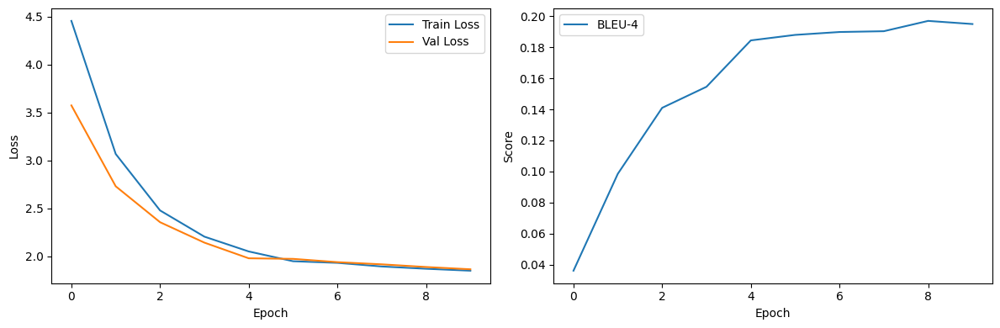

In [ ]:
# Choosing encoder and decoder
backbone = 'mobilenet'
decoder_type = 'lstm'
fine_tune_encoder = True

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Resnet18 + Transformer (4-token memory) with feature cache (frozen CNN)

Epoch 1/10


Training:  39%|███▉      | 54/137 [00:04<00:05, 15.80it/s, loss=2.64]

Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s]


{'loss': 2.108965516090393, 'bleu4': 0.10808945929037388, 'meteor': 0.332725423102451, 'mean_length': 15.10556446072819, 'std_length': 1.7618280823630719, 'degenerate_percentage': 74.05541561712846}
Train Loss: 2.9865
Val Loss: 2.1090
BLEU-4: 0.1081
Caption Length: 15.11 ± 1.76
Degenerate Repetitions: 74.06%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s]


{'loss': 1.785866618156433, 'bleu4': 0.13099835645446617, 'meteor': 0.3731801003968603, 'mean_length': 16.042821158690177, 'std_length': 1.1474718522823921, 'degenerate_percentage': 69.61300664071445}
Train Loss: 1.9222
Val Loss: 1.7859
BLEU-4: 0.1310
Caption Length: 16.04 ± 1.15
Degenerate Repetitions: 69.61%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


{'loss': 1.634894417391883, 'bleu4': 0.15105892990942016, 'meteor': 0.4176820046244634, 'mean_length': 16.967483398213876, 'std_length': 1.7865476147561217, 'degenerate_percentage': 15.869017632241814}
Train Loss: 1.7024
Val Loss: 1.6349
BLEU-4: 0.1511
Caption Length: 16.97 ± 1.79
Degenerate Repetitions: 15.87%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 1.5028275781207614, 'bleu4': 0.16104021256178758, 'meteor': 0.41592506682891667, 'mean_length': 16.16739180215251, 'std_length': 1.2651315962062508, 'degenerate_percentage': 73.40279367987176}
Train Loss: 1.5936
Val Loss: 1.5028
BLEU-4: 0.1610
Caption Length: 16.17 ± 1.27
Degenerate Repetitions: 73.40%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


{'loss': 1.4402634302775066, 'bleu4': 0.15844373192667843, 'meteor': 0.4082177645782239, 'mean_length': 15.939775589649646, 'std_length': 1.6623748176528514, 'degenerate_percentage': 22.09754980535837}
Train Loss: 1.4986
Val Loss: 1.4403
BLEU-4: 0.1584
Caption Length: 15.94 ± 1.66
Degenerate Repetitions: 22.10%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.3375326461262174, 'bleu4': 0.17439018680298854, 'meteor': 0.4351864481603724, 'mean_length': 15.957522326539959, 'std_length': 1.823856636961872, 'degenerate_percentage': 31.234256926952142}
Train Loss: 1.4024
Val Loss: 1.3375
BLEU-4: 0.1744
Caption Length: 15.96 ± 1.82
Degenerate Repetitions: 31.23%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


{'loss': 1.3326412439346313, 'bleu4': 0.17356007194758397, 'meteor': 0.44215417395425227, 'mean_length': 16.51614380581635, 'std_length': 1.5878670282784764, 'degenerate_percentage': 38.825280512937944}
Train Loss: 1.3396
Val Loss: 1.3326
BLEU-4: 0.1736
Caption Length: 16.52 ± 1.59
Degenerate Repetitions: 38.83%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 1.2897979815800984, 'bleu4': 0.18012187717840045, 'meteor': 0.4490103001288675, 'mean_length': 16.55175177467369, 'std_length': 1.6542894884765287, 'degenerate_percentage': 26.620105335470573}
Train Loss: 1.3345
Val Loss: 1.2898
BLEU-4: 0.1801
Caption Length: 16.55 ± 1.65
Degenerate Repetitions: 26.62%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


{'loss': 1.2962257266044617, 'bleu4': 0.1791865234870611, 'meteor': 0.4392024980687278, 'mean_length': 16.198305472864668, 'std_length': 1.6234250588095185, 'degenerate_percentage': 43.989008472635675}
Train Loss: 1.2972
Val Loss: 1.2962
BLEU-4: 0.1792
Caption Length: 16.20 ± 1.62
Degenerate Repetitions: 43.99%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


{'loss': 1.2485756874084473, 'bleu4': 0.17754604657652617, 'meteor': 0.4432394791497788, 'mean_length': 16.4461873139455, 'std_length': 1.560262202426228, 'degenerate_percentage': 37.48568811541104}
Train Loss: 1.2952
Val Loss: 1.2486
BLEU-4: 0.1775
Caption Length: 16.45 ± 1.56
Degenerate Repetitions: 37.49%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.47it/s]


Test Results:
BLEU-4: 0.1800
Caption Length: 16.54 ± 1.66
Degenerate Repetitions: 26.94%


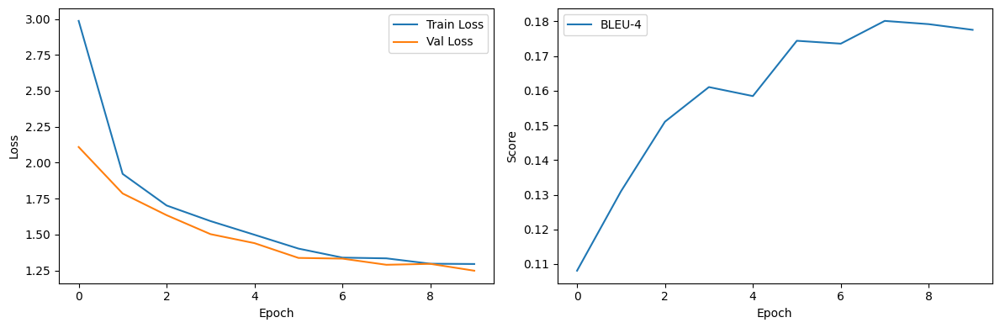

In [ ]:
# Choosing encoder and decoder
backbone = 'resnet18'
decoder_type = 'transformer'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Resnet18 + Transformer (4-token memory) with finetuning

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 2.0963692466417947, 'bleu4': 0.12241268162095134, 'meteor': 0.3519365939195839, 'mean_length': 15.594916418594, 'std_length': 0.9969505995471576, 'degenerate_percentage': 52.976871994504236}
Train Loss: 2.9705
Val Loss: 2.0964
BLEU-4: 0.1224
Caption Length: 15.59 ± 1.00
Degenerate Repetitions: 52.98%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 1.7941378288798862, 'bleu4': 0.14619420511400816, 'meteor': 0.3972948341754988, 'mean_length': 16.05988092512022, 'std_length': 1.220281356858818, 'degenerate_percentage': 50.59537439890085}
Train Loss: 1.9255
Val Loss: 1.7941
BLEU-4: 0.1462
Caption Length: 16.06 ± 1.22
Degenerate Repetitions: 50.60%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.50it/s]


{'loss': 1.6028498344951205, 'bleu4': 0.12960501395888355, 'meteor': 0.3801430951366052, 'mean_length': 16.585871307533775, 'std_length': 1.1429284234781047, 'degenerate_percentage': 31.142660865582776}
Train Loss: 1.7206
Val Loss: 1.6028
BLEU-4: 0.1296
Caption Length: 16.59 ± 1.14
Degenerate Repetitions: 31.14%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


{'loss': 1.5249872671233282, 'bleu4': 0.16478328344891616, 'meteor': 0.41408361925897486, 'mean_length': 14.880352644836272, 'std_length': 1.7442361002383298, 'degenerate_percentage': 48.568811541103734}
Train Loss: 1.5873
Val Loss: 1.5250
BLEU-4: 0.1648
Caption Length: 14.88 ± 1.74
Degenerate Repetitions: 48.57%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


{'loss': 1.437662614716424, 'bleu4': 0.18399646408413575, 'meteor': 0.4253123287648367, 'mean_length': 14.442637966567437, 'std_length': 2.182028980527726, 'degenerate_percentage': 21.399129837416993}
Train Loss: 1.4995
Val Loss: 1.4377
BLEU-4: 0.1840
Caption Length: 14.44 ± 2.18
Degenerate Repetitions: 21.40%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


{'loss': 1.3470081157154508, 'bleu4': 0.17536179610596653, 'meteor': 0.4347356942361605, 'mean_length': 15.685367529196245, 'std_length': 1.5777458960366988, 'degenerate_percentage': 33.44401190748798}
Train Loss: 1.3752
Val Loss: 1.3470
BLEU-4: 0.1754
Caption Length: 15.69 ± 1.58
Degenerate Repetitions: 33.44%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


{'loss': 1.331735610961914, 'bleu4': 0.1787514336057905, 'meteor': 0.439509726725731, 'mean_length': 15.836844515685826, 'std_length': 1.6291266123261483, 'degenerate_percentage': 46.08426837645981}
Train Loss: 1.3433
Val Loss: 1.3317
BLEU-4: 0.1788
Caption Length: 15.84 ± 1.63
Degenerate Repetitions: 46.08%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


{'loss': 1.2845234407318964, 'bleu4': 0.19175420395706072, 'meteor': 0.44980893514479514, 'mean_length': 15.328028394779025, 'std_length': 1.731495402253092, 'degenerate_percentage': 26.837645981222806}
Train Loss: 1.3324
Val Loss: 1.2845
BLEU-4: 0.1918
Caption Length: 15.33 ± 1.73
Degenerate Repetitions: 26.84%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


{'loss': 1.2719351748625438, 'bleu4': 0.19115910895939447, 'meteor': 0.44561822399442336, 'mean_length': 15.20322876116327, 'std_length': 1.7520398967973536, 'degenerate_percentage': 37.4627891000687}
Train Loss: 1.3084
Val Loss: 1.2719
BLEU-4: 0.1912
Caption Length: 15.20 ± 1.75
Degenerate Repetitions: 37.46%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.49it/s]


{'loss': 1.2385006447633107, 'bleu4': 0.18751983952011492, 'meteor': 0.4515277908477368, 'mean_length': 15.72200595374399, 'std_length': 1.5519782265903963, 'degenerate_percentage': 38.59629035951454}
Train Loss: 1.2876
Val Loss: 1.2385
BLEU-4: 0.1875
Caption Length: 15.72 ± 1.55
Degenerate Repetitions: 38.60%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


Test Results:
BLEU-4: 0.1916
Caption Length: 15.33 ± 1.73
Degenerate Repetitions: 26.59%


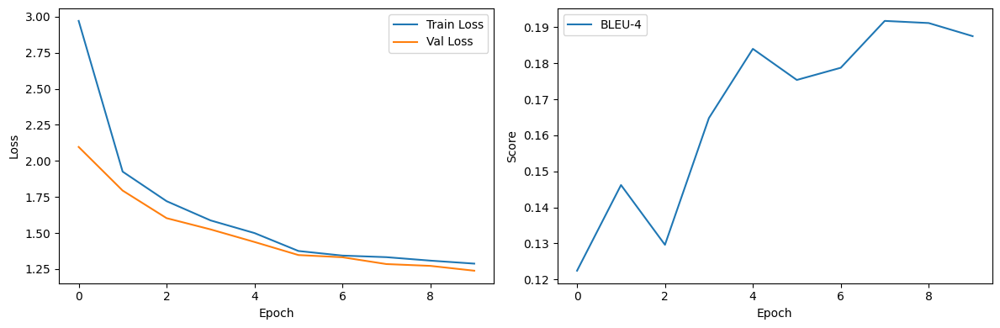

In [ ]:
# Choosing encoder and decoder
backbone = 'resnet18'
decoder_type = 'transformer'
fine_tune_encoder = True

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Mobilenet + Transformer (4-token memory) with feature cache (frozen CNN)

Epoch 1/10


Training:  50%|████▉     | 68/137 [00:04<00:04, 16.22it/s, loss=2.48]

Evaluation: 100%|██████████| 18/18 [00:13<00:00,  1.35it/s]


{'loss': 2.092154986328549, 'bleu4': 0.136722581226084, 'meteor': 0.35790615668212516, 'mean_length': 14.11506755209526, 'std_length': 1.5674791030536142, 'degenerate_percentage': 42.225784291275474}
Train Loss: 2.9613
Val Loss: 2.0922
BLEU-4: 0.1367
Caption Length: 14.12 ± 1.57
Degenerate Repetitions: 42.23%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:14<00:00,  1.24it/s]


{'loss': 1.7933753662639194, 'bleu4': 0.14956732184591276, 'meteor': 0.39062945801004306, 'mean_length': 15.398557362033433, 'std_length': 1.5467533169629193, 'degenerate_percentage': 61.449507671170146}
Train Loss: 1.9143
Val Loss: 1.7934
BLEU-4: 0.1496
Caption Length: 15.40 ± 1.55
Degenerate Repetitions: 61.45%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:14<00:00,  1.25it/s]


{'loss': 1.5723761452568903, 'bleu4': 0.1623545127958421, 'meteor': 0.41633994330226715, 'mean_length': 15.87416991069384, 'std_length': 1.4259330897817484, 'degenerate_percentage': 6.915502633386765}
Train Loss: 1.6794
Val Loss: 1.5724
BLEU-4: 0.1624
Caption Length: 15.87 ± 1.43
Degenerate Repetitions: 6.92%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:14<00:00,  1.26it/s]


{'loss': 1.4948582847913106, 'bleu4': 0.1631600106997577, 'meteor': 0.42137586410582034, 'mean_length': 16.148958094801923, 'std_length': 1.4565379525663473, 'degenerate_percentage': 29.150446530799172}
Train Loss: 1.5798
Val Loss: 1.4949
BLEU-4: 0.1632
Caption Length: 16.15 ± 1.46
Degenerate Repetitions: 29.15%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:13<00:00,  1.29it/s]


{'loss': 1.421010394891103, 'bleu4': 0.15287856415055356, 'meteor': 0.4083897887183225, 'mean_length': 16.679528280283947, 'std_length': 1.5283744684287173, 'degenerate_percentage': 6.262880696130066}
Train Loss: 1.4887
Val Loss: 1.4210
BLEU-4: 0.1529
Caption Length: 16.68 ± 1.53
Degenerate Repetitions: 6.26%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s]


{'loss': 1.3449193901485867, 'bleu4': 0.17708809627691763, 'meteor': 0.44376663799450106, 'mean_length': 16.348866498740556, 'std_length': 1.4342311462255561, 'degenerate_percentage': 24.318754293565377}
Train Loss: 1.3646
Val Loss: 1.3449
BLEU-4: 0.1771
Caption Length: 16.35 ± 1.43
Degenerate Repetitions: 24.32%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


{'loss': 1.2912139627668593, 'bleu4': 0.1871093698988486, 'meteor': 0.44700985548804156, 'mean_length': 16.2397526906343, 'std_length': 1.5812459204921354, 'degenerate_percentage': 19.361117471948706}
Train Loss: 1.3336
Val Loss: 1.2912
BLEU-4: 0.1871
Caption Length: 16.24 ± 1.58
Degenerate Repetitions: 19.36%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.2828158504433103, 'bleu4': 0.18427395601610103, 'meteor': 0.44547964511717164, 'mean_length': 16.198763453171512, 'std_length': 1.5552177939708522, 'degenerate_percentage': 12.754751545683535}
Train Loss: 1.2997
Val Loss: 1.2828
BLEU-4: 0.1843
Caption Length: 16.20 ± 1.56
Degenerate Repetitions: 12.75%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.2591132488515642, 'bleu4': 0.1824398185503971, 'meteor': 0.44995669945946326, 'mean_length': 16.604076024730936, 'std_length': 1.407595562767038, 'degenerate_percentage': 21.902908174948475}
Train Loss: 1.2892
Val Loss: 1.2591
BLEU-4: 0.1824
Caption Length: 16.60 ± 1.41
Degenerate Repetitions: 21.90%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


{'loss': 1.2346510920259688, 'bleu4': 0.18510707157962022, 'meteor': 0.4552821217509485, 'mean_length': 16.560682390657202, 'std_length': 1.3627304893647687, 'degenerate_percentage': 14.334783604305015}
Train Loss: 1.2699
Val Loss: 1.2347
BLEU-4: 0.1851
Caption Length: 16.56 ± 1.36
Degenerate Repetitions: 14.33%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


Test Results:
BLEU-4: 0.1854
Caption Length: 16.25 ± 1.58
Degenerate Repetitions: 18.55%


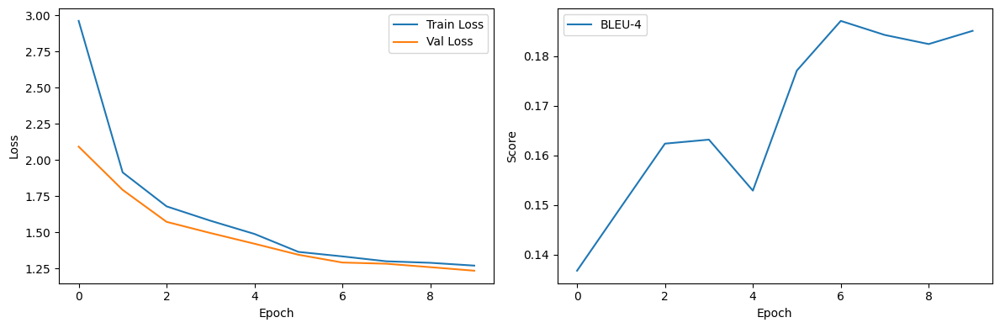

In [ ]:
# Choosing encoder and decoder
backbone = 'mobilenet'
decoder_type = 'transformer'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Mobilenet + Transformer (4-token memory) with finetuning

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


{'loss': 2.084785375330183, 'bleu4': 0.11770236659962864, 'meteor': 0.3474149112550188, 'mean_length': 15.239523700480879, 'std_length': 0.9714799780103875, 'degenerate_percentage': 97.8131440348065}
Train Loss: 2.9592
Val Loss: 2.0848
BLEU-4: 0.1177
Caption Length: 15.24 ± 0.97
Degenerate Repetitions: 97.81%
Epoch 2/10


Training:  74%|███████▍  | 102/137 [00:06<00:02, 16.16it/s, loss=1.74]

Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.7430590391159058, 'bleu4': 0.14467600236965725, 'meteor': 0.3808997144933228, 'mean_length': 15.620219830547287, 'std_length': 1.2646788312188073, 'degenerate_percentage': 92.9814517975727}
Train Loss: 1.9191
Val Loss: 1.7431
BLEU-4: 0.1447
Caption Length: 15.62 ± 1.26
Degenerate Repetitions: 92.98%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


{'loss': 1.6106823749012418, 'bleu4': 0.16063305666490552, 'meteor': 0.4144680204222689, 'mean_length': 15.879093198992443, 'std_length': 1.1364600215569436, 'degenerate_percentage': 76.57430730478589}
Train Loss: 1.6889
Val Loss: 1.6107
BLEU-4: 0.1606
Caption Length: 15.88 ± 1.14
Degenerate Repetitions: 76.57%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.506249772177802, 'bleu4': 0.16587397663055817, 'meteor': 0.4050175026587445, 'mean_length': 15.27055186626975, 'std_length': 1.4875133257242013, 'degenerate_percentage': 85.98580261048775}
Train Loss: 1.5715
Val Loss: 1.5062
BLEU-4: 0.1659
Caption Length: 15.27 ± 1.49
Degenerate Repetitions: 85.99%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.41it/s]


{'loss': 1.4223900437355042, 'bleu4': 0.1670000544612493, 'meteor': 0.4108456632877009, 'mean_length': 15.720288527593313, 'std_length': 1.463222322173562, 'degenerate_percentage': 78.85275933134875}
Train Loss: 1.4749
Val Loss: 1.4224
BLEU-4: 0.1670
Caption Length: 15.72 ± 1.46
Degenerate Repetitions: 78.85%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.3276227845085993, 'bleu4': 0.18492467017669809, 'meteor': 0.4442675292363933, 'mean_length': 15.935195786581177, 'std_length': 1.5044899146471955, 'degenerate_percentage': 70.00228990153423}
Train Loss: 1.3593
Val Loss: 1.3276
BLEU-4: 0.1849
Caption Length: 15.94 ± 1.50
Degenerate Repetitions: 70.00%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


{'loss': 1.2828265229860942, 'bleu4': 0.1879566916275766, 'meteor': 0.45359124717822624, 'mean_length': 16.100526677352875, 'std_length': 1.459464408964985, 'degenerate_percentage': 73.03640943439433}
Train Loss: 1.3230
Val Loss: 1.2828
BLEU-4: 0.1880
Caption Length: 16.10 ± 1.46
Degenerate Repetitions: 73.04%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.278651711013582, 'bleu4': 0.1898079651691546, 'meteor': 0.4564141012942194, 'mean_length': 16.060338905427066, 'std_length': 1.4663308305139322, 'degenerate_percentage': 73.39134417220059}
Train Loss: 1.3018
Val Loss: 1.2787
BLEU-4: 0.1898
Caption Length: 16.06 ± 1.47
Degenerate Repetitions: 73.39%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.44it/s]


{'loss': 1.2663156158394284, 'bleu4': 0.19122408880108782, 'meteor': 0.45927801872388135, 'mean_length': 16.132241813602015, 'std_length': 1.429363494117483, 'degenerate_percentage': 75.7270437371193}
Train Loss: 1.2928
Val Loss: 1.2663
BLEU-4: 0.1912
Caption Length: 16.13 ± 1.43
Degenerate Repetitions: 75.73%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.2275230354732938, 'bleu4': 0.1927015248368136, 'meteor': 0.4582417574255255, 'mean_length': 16.041218227616213, 'std_length': 1.369929664707043, 'degenerate_percentage': 72.56697961987635}
Train Loss: 1.2534
Val Loss: 1.2275
BLEU-4: 0.1927
Caption Length: 16.04 ± 1.37
Degenerate Repetitions: 72.57%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


Test Results:
BLEU-4: 0.1906
Caption Length: 16.05 ± 1.36
Degenerate Repetitions: 72.37%


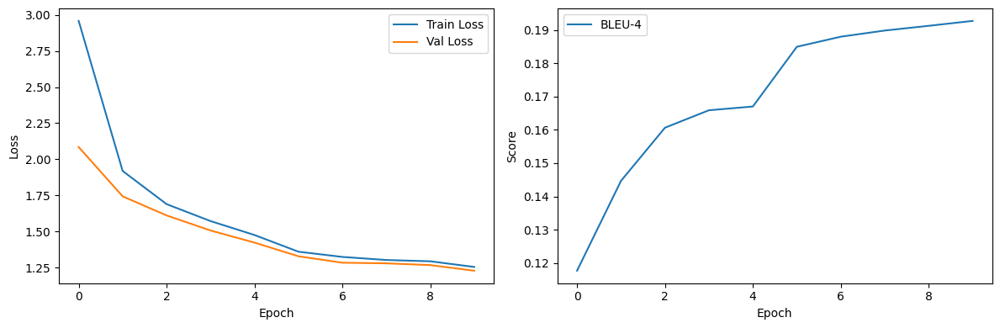

In [ ]:
# Choosing encoder and decoder
backbone = 'mobilenet'
decoder_type = 'transformer'
fine_tune_encoder = True

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


# Evaluation, Analysis & Explainability

Function to denormalize tensors

In [ ]:
def denormalize(tensor, mean=IMAGENET_MEAN, std=IMAGENET_STD):
    # Clone the tensor to not make in-place changes
    tensor = tensor.clone()

    # Denormalize each channel
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)

    # Clip to [0, 1] range
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

def save_image(tensor, filename):
    # Convert tensor to PIL Image
    if tensor.dim() == 4:
        tensor = tensor.squeeze(0)
    if tensor.dim() == 3 and tensor.size(0) == 3:
        tensor = tensor.permute(1, 2, 0)

    # Convert to numpy and scale to 0-255
    img_np = tensor.numpy() * 255
    img_np = img_np.astype(np.uint8)

    img = Image.fromarray(img_np)
    img.save(filename)

# 10 success and 10 failure examples (images + GT captions + my predicted caption)


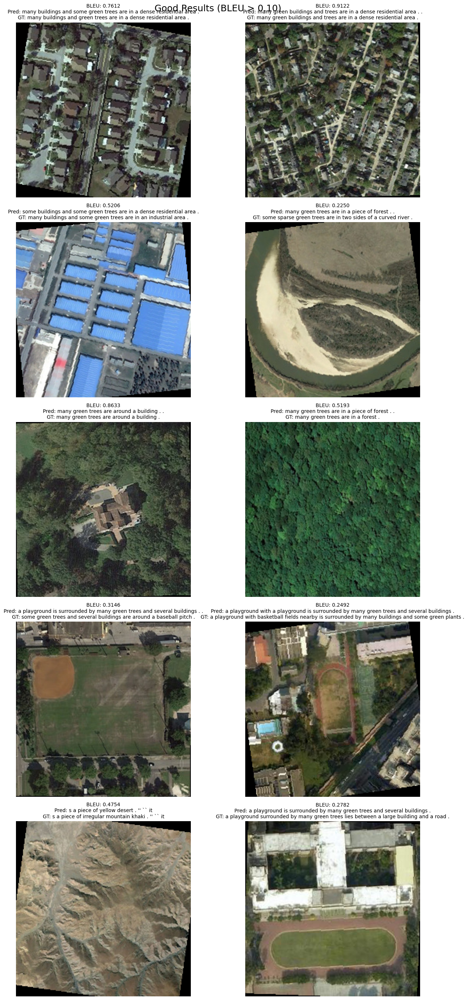

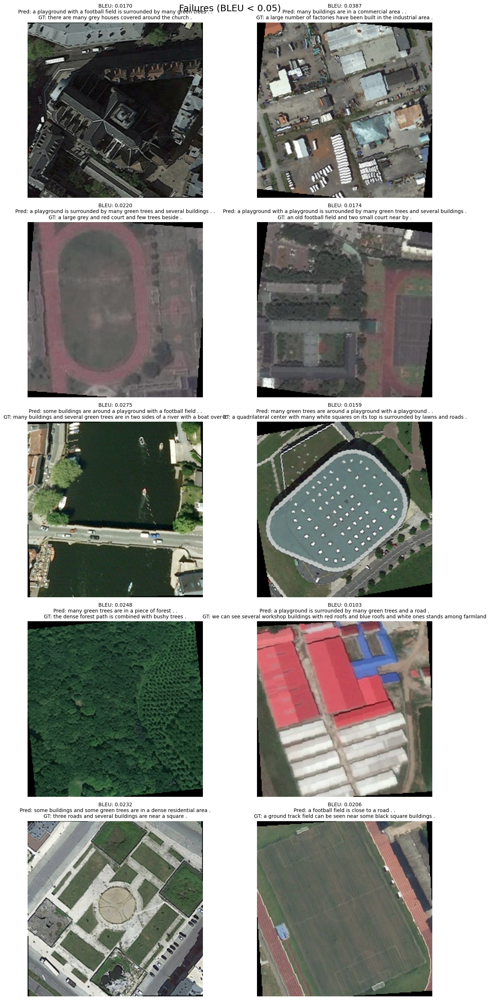

{'good': [{'image': tensor([[[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            ...,
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00],
            [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
             0.0000e+00, 0.0000e+00]],
   
           [[2.9802e-08, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08,
             2.9802e-08, 2.9802e-08],
            [2.9802e-08, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08,
             2.9802e-08, 2.9802e-08],
            [2.9802e-08, 2.9802e-08, 2.9802e-08,  ..., 2.9802e-08,
             2.9802e-08, 2.9802e-08],
            ...,

In [ ]:
def analyze_qualitative_results(model, dataloader, num_examples=100):
    model.eval()
    results = []

    smooth = SmoothingFunction().method1

    with torch.no_grad():
        for i, (images, captions, lengths) in enumerate(dataloader):
            images = images.to(device)
            captions = captions.to(device)

            # Generate captions
            generated_captions, _ = model.generate_caption(images)

            for j in range(len(images)):
                if len(results) >= num_examples:
                    break

                # Generated caption
                gen_caption_ids = generated_captions[j].cpu().numpy()
                gen_words = [idx_to_word.get(idx, '<unk>')
                             for idx in gen_caption_ids
                             if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                gen_caption = ' '.join(gen_words)

                # Reference caption
                ref_caption_ids = captions[j].cpu().numpy()
                ref_words = [idx_to_word.get(idx, '<unk>')
                             for idx in ref_caption_ids
                             if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                ref_caption = ' '.join(ref_words)

                # BLEU score
                bleu = sentence_bleu([ref_words], gen_words,
                                     weights=(0.25, 0.25, 0.25, 0.25),
                                     smoothing_function=smooth)

                # Denormalize image
                img = denormalize(images[j].cpu())

                results.append({
                    "image": img,
                    "generated": gen_caption,
                    "reference": ref_caption,
                    "bleu": bleu
                })

            if len(results) >= num_examples:
                break

    # Split into good and failures
    good = [res for res in results if res["bleu"] > 0.15]
    bad  = [res for res in results if res["bleu"] < 0.05 and res["bleu"]>0.01]

    # --- Plot Good Results ---
    if good:
        fig, axes = plt.subplots(5, 2, figsize=(14, 28))
        fig.suptitle("Good Results (BLEU > 0.10)", fontsize=18)
        for ax, res in zip(axes.flatten(), good[:10]):  # show at most 10
            ax.imshow(res["image"].permute(1, 2, 0))
            ax.axis("off")
            ax.set_title(
                f"BLEU: {res['bleu']:.4f}\nPred: {res['generated']}\nGT: {res['reference']}",
                fontsize=10
            )
        plt.tight_layout()
        plt.show()

    # --- Plot Failure Results ---
    if bad:
        fig, axes = plt.subplots(5, 2, figsize=(14, 28))
        fig.suptitle("Failures (BLEU < 0.05)", fontsize=18)
        for ax, res in zip(axes.flatten(), bad[:10]):  # show at most 10
            ax.imshow(res["image"].permute(1, 2, 0))
            ax.axis("off")
            ax.set_title(
                f"BLEU: {res['bleu']:.4f}\nPred: {res['generated']}\nGT: {res['reference']}",
                fontsize=10
            )
        plt.tight_layout()
        plt.show()

    return {"good": good, "bad": bad}

analyze_qualitative_results(model, test_dataloader)


# Slice-based qualitative analysis (bright/dark image, short/long caption)

Analyzing slices: 100%|██████████| 3/3 [00:04<00:00,  1.34s/it]


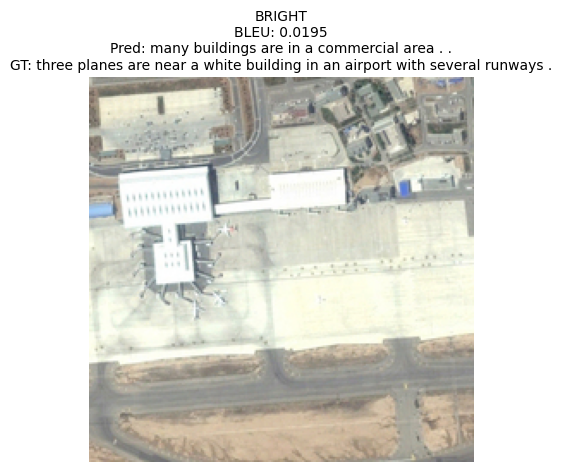

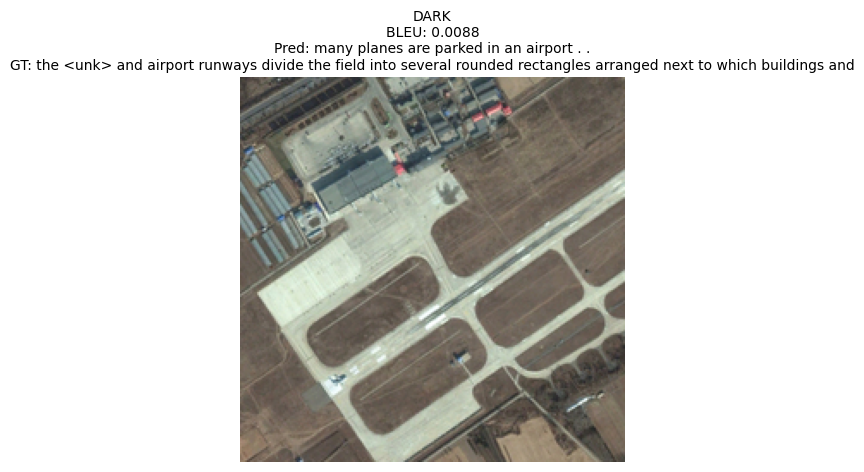

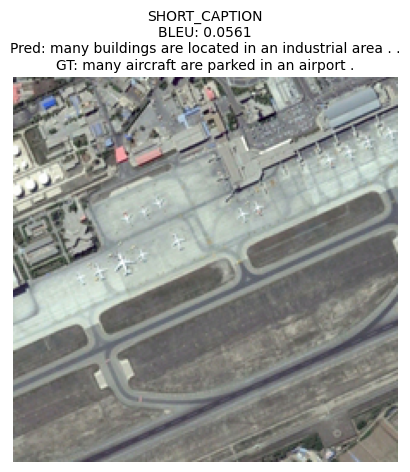

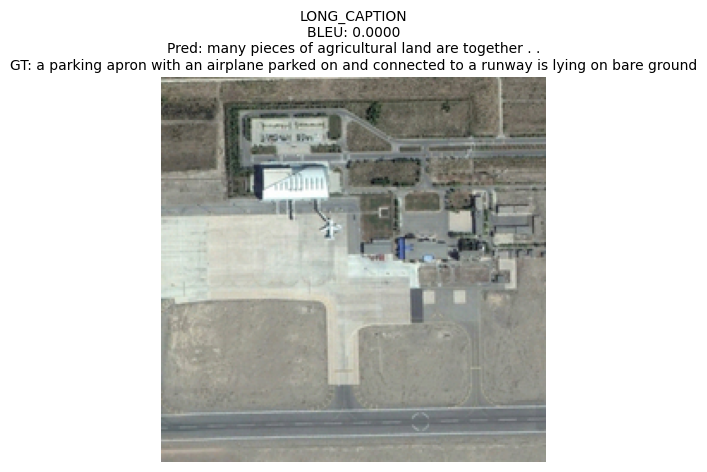

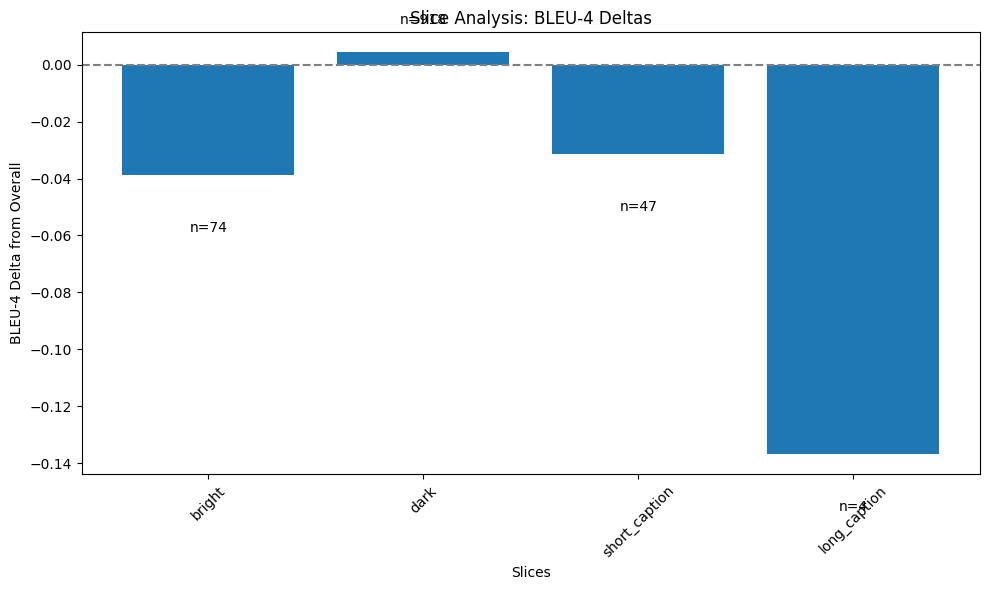

{'bright': {'bleu4': 0.09814697592356622,
  'count': 74,
  'delta': -0.03864427444756258},
 'dark': {'bleu4': 0.14111105216560121,
  'count': 918,
  'delta': 0.0043198017944724165},
 'short_caption': {'bleu4': 0.10526711145654861,
  'count': 47,
  'delta': -0.03152413891458018},
 'long_caption': {'bleu4': 1.4273335194349377e-78,
  'count': 4,
  'delta': -0.1367912503711288}}

In [ ]:
def analyze_slices(model, dataloader):
    model.eval()

    # Initialize slice trackers
    slices = {
        'bright': {'references': [], 'hypotheses': [], 'images': [], 'captions': []},
        'dark': {'references': [], 'hypotheses': [], 'images': [], 'captions': []},
        'short_caption': {'references': [], 'hypotheses': [], 'images': [], 'captions': []},
        'long_caption': {'references': [], 'hypotheses': [], 'images': [], 'captions': []},
    }

    smooth = SmoothingFunction().method1

    with torch.no_grad():
        for batch_idx, (images, captions, lengths) in enumerate(tqdm(dataloader, desc="Analyzing slices")):
            images = images.to(device)
            captions = captions.to(device)

            # Generate captions
            generated_captions, _ = model.generate_caption(images)

            for i in range(len(images)):
                img = images[i].cpu()
                brightness = img.mean().item()

                # Convert to words
                gen_caption_ids = generated_captions[i].cpu().numpy()
                gen_words = [idx_to_word.get(idx, '<unk>') for idx in gen_caption_ids if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                gen_caption = " ".join(gen_words)

                ref_caption_ids = captions[i].cpu().numpy()
                ref_words = [idx_to_word.get(idx, '<unk>') for idx in ref_caption_ids if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                ref_caption = " ".join(ref_words)

                bleu = sentence_bleu([ref_words], gen_words,
                                     weights=(0.25,0.25,0.25,0.25),
                                     smoothing_function=smooth)

                # Decide slice category
                target = None
                if brightness > 0.7:
                    target = "bright"
                elif brightness < 0.3:
                    target = "dark"
                elif len(ref_words) <= 8:
                    target = "short_caption"
                elif len(ref_words) >= 16:
                    target = "long_caption"

                if target:
                    slices[target]['references'].append([ref_words])
                    slices[target]['hypotheses'].append(gen_words)
                    slices[target]['images'].append(denormalize(img))
                    slices[target]['captions'].append((ref_caption, gen_caption, bleu))

    # --- Calculate slice BLEU-4 ---
    slice_results = {}
    all_references, all_hypotheses = [], []
    for slice_name, data in slices.items():
        if data['references']:
            bleu4 = corpus_bleu(data['references'], data['hypotheses'],
                                weights=(0.25, 0.25, 0.25, 0.25))
            slice_results[slice_name] = {'bleu4': bleu4, 'count': len(data['references'])}
            all_references.extend(data['references'])
            all_hypotheses.extend(data['hypotheses'])

    overall_bleu4 = corpus_bleu(all_references, all_hypotheses,
                                weights=(0.25, 0.25, 0.25, 0.25))

    for name, res in slice_results.items():
        res['delta'] = res['bleu4'] - overall_bleu4

    # --- Show one qualitative example per slice ---
    for slice_name, data in slices.items():
        if len(data['images']) > 0:
            img = data['images'][0]
            ref_caption, gen_caption, bleu = data['captions'][0]

            plt.figure(figsize=(5,5))
            plt.imshow(img.permute(1,2,0))
            plt.axis("off")
            plt.title(f"{slice_name.upper()}\nBLEU: {bleu:.4f}\nPred: {gen_caption}\nGT: {ref_caption}", fontsize=10)
            plt.show()

    # --- Plot per-slice BLEU deltas ---
    plt.figure(figsize=(10,6))
    slice_names = list(slice_results.keys())
    deltas = [slice_results[name]['delta'] for name in slice_names]
    counts = [slice_results[name]['count'] for name in slice_names]

    plt.bar(slice_names, deltas)
    plt.axhline(0, color="gray", linestyle="--")
    plt.xlabel("Slices")
    plt.ylabel("BLEU-4 Delta from Overall")
    plt.title("Slice Analysis: BLEU-4 Deltas")
    plt.xticks(rotation=45)

    # Add counts on bars
    for i, v in enumerate(deltas):
        plt.text(i, v + (0.01 if v >= 0 else -0.02), f"n={counts[i]}", ha="center")

    plt.tight_layout()
    plt.show()

    return slice_results

analyze_slices(model,test_dataloader)


# Grad-CAM for visualizing model attention on input images

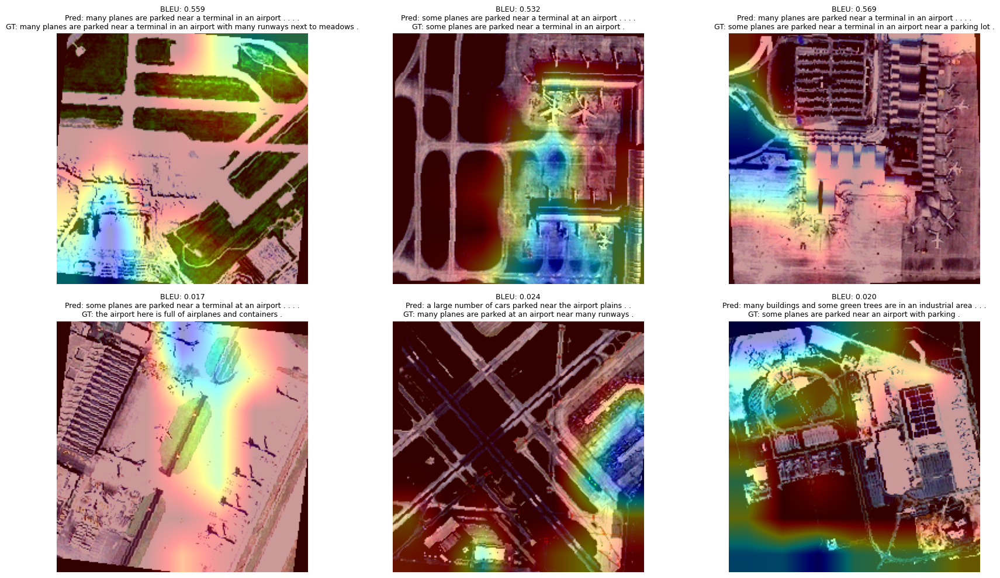

[{'image': tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           ...,
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],
  
          [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           ...,
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],
  
          [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
  

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_image, target_index):
        input_image.requires_grad = True  # make sure gradients can flow

        output = self.model(input_image)  # forward pass
        self.model.zero_grad()

        # pick the last token logit
        one_hot = torch.zeros_like(output)
        one_hot[0, target_index] = 1.0
        output.backward(gradient=one_hot, retain_graph=True)

        pooled_gradients = torch.mean(self.gradients, dim=[0,2,3])
        activations = self.activations[0]
        for i in range(activations.shape[0]):
            activations[i] *= pooled_gradients[i]
        heatmap = torch.mean(activations, dim=0)
        heatmap = F.relu(heatmap)
        heatmap /= torch.max(heatmap)
        return heatmap.cpu().numpy()

def visualize_gradcam_grid(model, dataloader, num_examples=100):
    model.eval()
    smooth = SmoothingFunction().method1
    examples = []

    # Collect examples
    with torch.no_grad():
        for images, captions, lengths in dataloader:
            images = images.to(device)
            captions = captions.to(device)
            generated_captions, _ = model.generate_caption(images)

            for i in range(len(images)):
                gen_caption_ids = generated_captions[i].cpu().numpy()
                gen_words = [idx_to_word.get(idx, '<unk>') for idx in gen_caption_ids if idx not in [PAD_IDX,BOS_IDX,EOS_IDX]]
                gen_caption = ' '.join(gen_words)

                ref_caption_ids = captions[i].cpu().numpy()
                ref_words = [idx_to_word.get(idx, '<unk>') for idx in ref_caption_ids if idx not in [PAD_IDX,BOS_IDX,EOS_IDX]]
                ref_caption = ' '.join(ref_words)

                bleu_score = sentence_bleu([ref_words], gen_words, weights=(0.25,0.25,0.25,0.25), smoothing_function=smooth)

                examples.append({
                    'image': images[i].cpu(),
                    'generated': gen_caption,
                    'reference': ref_caption,
                    'bleu': bleu_score
                })
            if len(examples) >= num_examples:
                break

    # Pick 3 good and 3 bad
    high_bleu = [ex for ex in examples if 0.5 <= ex['bleu'] <= 0.7]
    low_bleu = [ex for ex in examples if 0.01 <= ex['bleu'] <= 0.05]

    # Pick up to 3 from each
    selected = high_bleu[:3] + low_bleu[:3]


    # Use last conv layer of CNN encoder
    last_conv = list(model.encoder.cnn.children())[-1]
    gradcam = GradCAM(model.encoder, last_conv)

    # Plot
    fig, axes = plt.subplots(2,3,figsize=(18,10))
    for idx, case in enumerate(selected):
        img_tensor = case['image'].unsqueeze(0).to(device)
        target_idx = 0  # last token could also be used if you want

        heatmap = gradcam.generate(img_tensor, target_idx)

        img_np = case['image'].numpy().transpose(1,2,0)
        img_np = np.clip(img_np, 0, 1)

        heatmap_resized = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))
        heatmap_uint8 = np.uint8(255 * heatmap_resized)
        heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
        overlayed = 0.6*img_np + 0.4*(heatmap_color/255.0)
        overlayed = np.clip(overlayed,0,1)

        row, col = idx//3, idx%3
        axes[row,col].imshow(overlayed)
        axes[row,col].axis('off')
        axes[row,col].set_title(f"BLEU: {case['bleu']:.3f}\nPred: {case['generated']}\nGT: {case['reference']}", fontsize=9)

    plt.tight_layout()
    plt.show()

    return selected

visualize_gradcam_grid(model, test_dataloader)


# Token importance for captions using LSTM occlusion or Transformer attention

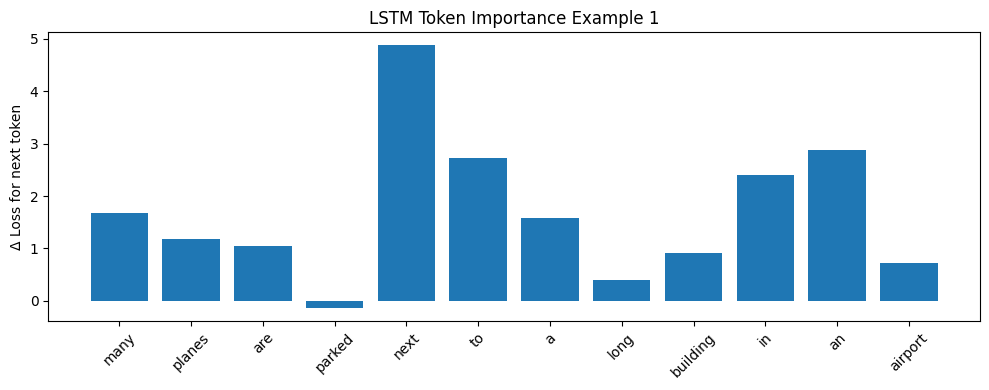

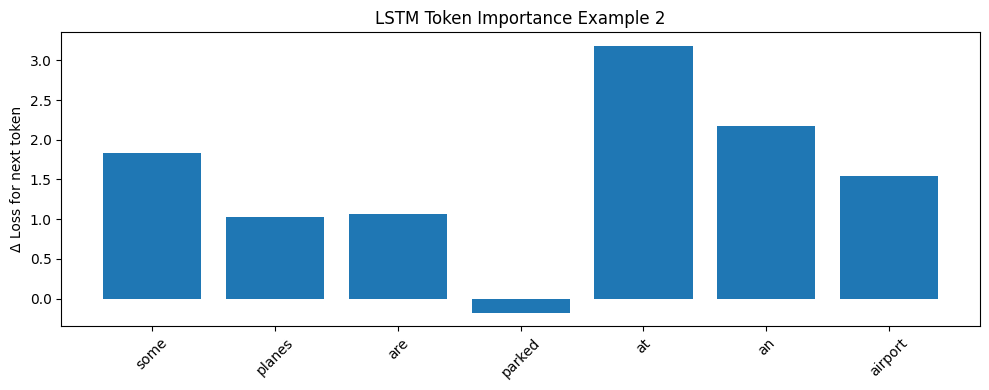

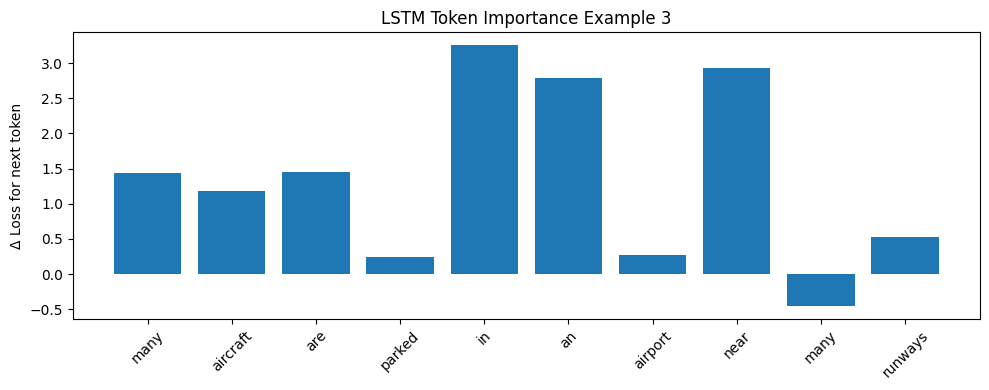

In [ ]:
def analyze_text_importance(model, dataloader, num_examples=3, max_len=20):

    model.eval()
    results = []
    criterion = nn.CrossEntropyLoss(reduction='none')

    with torch.no_grad():
        for images, captions, lengths in dataloader:
            images = images.to(device)
            captions = captions.to(device)

            for i in range(len(images)):
                if len(results) >= num_examples:
                    break

                img = images[i].unsqueeze(0)
                caption = captions[i]
                caption_len = lengths[i].item()

                # LSTM: token occlusion
                if isinstance(model.decoder, LSTMDecoder):
                    token_importances = []

                    for t in range(1, min(max_len, caption_len-1)):
                        # Predict original token t+1
                        orig_output = model(img, caption.unsqueeze(0)[:, :-1], torch.tensor([caption_len-1]).to(device))
                        orig_logits = orig_output[0, t, :]  # predict token t
                        orig_loss = criterion(orig_logits.unsqueeze(0), caption[t+1].unsqueeze(0))

                        # Mask token t
                        masked_caption = caption.clone()
                        masked_caption[t] = PAD_IDX
                        masked_output = model(img, masked_caption.unsqueeze(0)[:, :-1], torch.tensor([caption_len-1]).to(device))
                        masked_logits = masked_output[0, t, :]
                        masked_loss = criterion(masked_logits.unsqueeze(0), caption[t+1].unsqueeze(0))

                        delta_loss = (masked_loss - orig_loss).item()
                        token_importances.append(delta_loss)

                    tokens = [idx_to_word.get(idx, '<unk>') for idx in caption.cpu().numpy() if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                    results.append({'type': 'LSTM', 'tokens': tokens, 'importances': token_importances})

                # Transformer: average attention maps
                elif isinstance(model.decoder, TransformerDecoder):
                    output, attn_weights = model(img, caption.unsqueeze(0)[:, :-1], torch.tensor([caption_len-1]).to(device), return_attentions=True)
                    attn_avg = attn_weights[-1].mean(dim=1).mean(dim=1).cpu().numpy()  # [seq_len]
                    tokens = [idx_to_word.get(idx, '<unk>') for idx in caption.cpu().numpy() if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                    results.append({'type': 'Transformer', 'tokens': tokens, 'attention': attn_avg})

            if len(results) >= num_examples:
                break
    # Plot results
    for i, res in enumerate(results):
        plt.figure(figsize=(10,4))
        if res['type'] == 'LSTM':
            res['tokens'] = res['tokens'][:-1]
            res['importances'] = res['importances'][:-1]
            plt.bar(range(len(res['importances'])), res['importances'])
            plt.xticks(range(len(res['tokens'][0:len(res['importances'])])),
                       res['tokens'][0:len(res['importances'])], rotation=45)
            plt.ylabel('Δ Loss for next token')
            plt.title(f'LSTM Token Importance Example {i+1}')
        else:
            plt.bar(range(len(res['attention'])), res['attention'])
            plt.xticks(range(len(res['tokens'])), res['tokens'], rotation=45)
            plt.ylabel('Avg Attention (last layer)')
            plt.title(f'Transformer Token Attention Example {i+1}')
        plt.tight_layout()
        plt.show()

    return results

# Testing it on our LSTM decoder

backbone = 'resnet18'
decoder_type = 'lstm'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))


results = analyze_text_importance(model, test_dataloader, num_examples=3)


Why **attention ≠ explanation**?

The statement **attention ≠ explanation** means that high attention weight on a token doesn’t necessarily cause the model’s prediction. Attention shows how much the model looks at each token when computing representations but doesn’t directly indicate which tokens drive the output. A token with high attention may have little effect if downstream layers transform its contribution, and since Transformers combine multiple layers and attention heads, averaging attention even from the last layer is only an approximation, not a true explanation.


# Mis-caption case study

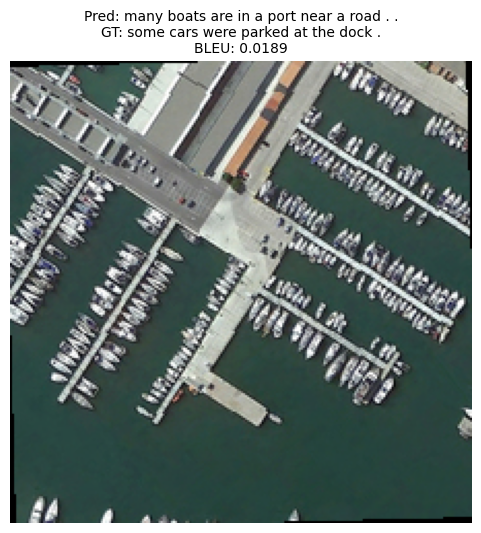

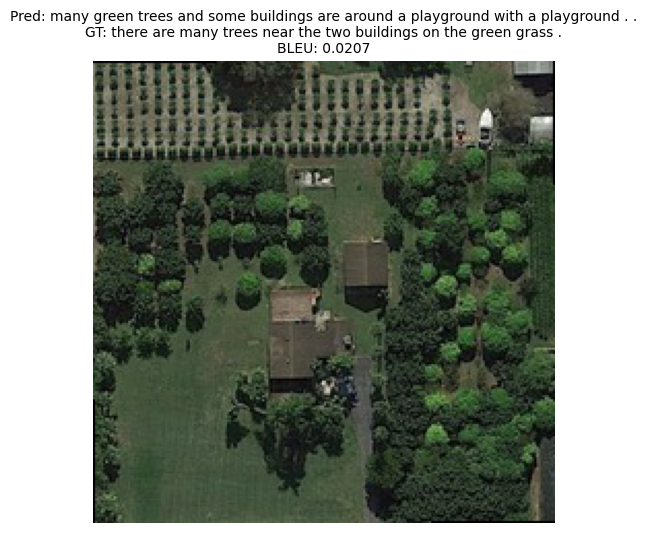

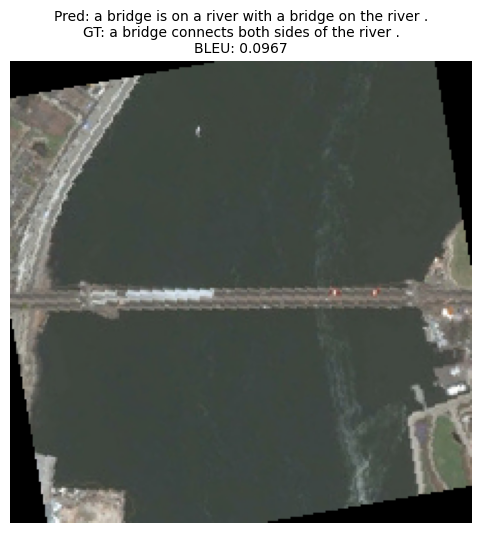

[{'image': tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           ...,
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
           [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],
  
          [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           ...,
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
           [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],
  
          [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
  

In [ ]:
def mis_caption_case_study(model, dataloader, num_cases=3):
    model.eval()
    cases = []
    smooth = SmoothingFunction().method1

    with torch.no_grad():
        for images, captions, lengths in dataloader:
            if len(cases) >= num_cases:
                break

            images = images.to(device)
            captions = captions.to(device)

            # Generate captions
            generated_captions, _ = model.generate_caption(images)

            for i in range(len(images)):
                if len(cases) >= num_cases:
                    break

                # Get captions
                gen_caption_ids = generated_captions[i].cpu().numpy()
                gen_words = [idx_to_word.get(idx, '<unk>') for idx in gen_caption_ids if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                gen_caption = ' '.join(gen_words)

                ref_caption_ids = captions[i].cpu().numpy()
                ref_words = [idx_to_word.get(idx, '<unk>') for idx in ref_caption_ids if idx not in [PAD_IDX, BOS_IDX, EOS_IDX]]
                ref_caption = ' '.join(ref_words)

                # Calculate BLEU score
                bleu_score = sentence_bleu([ref_words], gen_words, weights=(0.25,0.25,0.25,0.25), smoothing_function=smooth)

                # Only consider cases with low BLEU score
                if bleu_score < 0.1:
                    img = images[i].cpu()

                    cases.append({
                        'image': img,
                        'generated_caption': gen_caption,
                        'reference_caption': ref_caption,
                        'bleu_score': bleu_score
                    })

    # Plot each mis-caption case
    for i, case in enumerate(cases):
        plt.figure(figsize=(6,6))
        img = denormalize(case['image'])  # make sure denormalize is implemented
        plt.imshow(img.permute(1,2,0))
        plt.axis('off')
        plt.title(f"Pred: {case['generated_caption']}\nGT: {case['reference_caption']}\nBLEU: {case['bleu_score']:.4f}", fontsize=10)
        plt.show()

    return cases

mis_caption_case_study(model, train_dataloader)


### Mis-caption Case 1

- **Cause:** The model confused cars with boats due to the **long distance view** and visual similarity of small objects in the dock area.  
- **Non-advanced Fix (not implemented):** Use simple **data augmentation with zoom-in/cropping** to help the model better distinguish small, distant objects like cars vs. boats.  

---

### Mis-caption Case 2

- **Cause:** The scene was dominated by **trees and greenery**, causing the model to miss or miscount the buildings and hallucinate a playground.  
- **Non-advanced Fix (not implemented):** Add more **training images with buildings in green areas** so the model learns to spot them even when surrounded by trees.  

---

### Mis-caption Case 3

- **Cause:** The image contained mostly **water with only a thin bridge**, making the model emphasize repetitive “bridge on river” phrasing instead of the relational concept of connection.  
- **Non-advanced Fix (not implemented):** Use a **simple text post-processing rule** to remove repeated phrases (e.g., if “bridge” appears twice in a row, drop one).  


# LLM-Aware Development & Debugging Diary

# Error 1

 Error occurred at

loss = criterion(
    outputs.contiguous().view(-1, outputs.size(-1)),
    captions[:, 1:].contiguous().view(-1)
)

ValueError: Expected input batch_size (672) to match target batch_size (736)


Cause:
The LSTM decoder’s output (outputs) and target captions (captions[:,1:]) had mismatched flattened sizes. This happened because pack_padded_sequence sometimes produced sequences shorter than MAX_CAPTION_LENGTH-1 due to padding/truncation issues.

Fix:

Clamped lengths to MAX_CAPTION_LENGTH-1 when packing and unpacking

# Error 2

 Triggered at:

loss = (loss.view(outputs.size(0), -1) * mask).sum() / mask.sum()

RuntimeError: shape '[32, -1]' is invalid for input of size 1


Cause: loss shape doesn’t match (batch_size, seq_len) because CrossEntropyLoss was not set to reduction='none'

Fix: Set reduction='none' in the criterion and reshape loss before applying the mask

# Error 3

Error trigger at:

meteor_scores.append(meteor_score([' '.join(ref[0])], ' '.join(hyp)))

Error:

TypeError: "hypothesis" expects pre-tokenized hypothesis (Iterable[str]): many green trees are in a piece of green trees .


Cause: The hypothesis was passed as a string instead of a list of tokens.

Fix: Pass the hypothesis as a tokenized list:

meteor_scores.append(meteor_score([ref[0]], hyp))

# Error 4

Error trigger at:

hyp_idx = hypos[i]

if eos_idx in hyp_idx:

        hyp_idx = hyp_idx[:hyp_idx.index(eos_idx)+1]


Error:
With CUDA, hypos[i] is a tensor, so if eos_idx in hyp_idx fails to properly detect <eos> and hyp_words ends up empty, causing BLEU-4, METEOR, and length stats to be 0.

Cause: The hypothesis tensor was not moved to CPU and converted to a list before iterating. Operations like in or .index() don’t work as expected on CUDA tensors.

Fix: Convert to list on CPU before processing:

if isinstance(hypos[i], torch.Tensor):

        hyp_idx = hypos[i].cpu().tolist()

# Error 5

Error trigger:

mem = self.image_projection(image_features)


Error:

RuntimeError: mat1 and mat2 shapes cannot be multiplied (64x3 and 512x2048)


Cause: The CNN encoder output dimension (mobilenet: 1280) does not match the decoder’s image_projection input (hardcoded 512). Also, in your mobilenet slicing, self.cnn = nn.Sequential(*list(self.cnn.children())[:-2]) may produce a small feature map, sometimes collapsing to 3 channels instead of 1280.

Fix: Ensure encoder output matches projection input:

decoder = TransformerDecoder(
    vocab_size=len(vocab),
    embedding_dim=embedding_dim,
    num_layers=num_layers,
    num_heads=num_heads,
    num_mem_tokens=num_mem_tokens,
    feature_dim=encoder.feature_dim  # match encoder
)

self.image_projection = nn.Linear(feature_dim, num_mem_tokens * embedding_dim)


Also, for mobilenet, slice correctly:

self.cnn = nn.Sequential(*list(self.cnn.children())[:-1])

# Error 6

Error trigger:

h0 = self.image_projection(image_features).unsqueeze(0).repeat(self.num_layers, 1, 1)
c0 = torch.zeros_like(h0)


Error: Suboptimal captioning performance; LSTM cell state c0 initialized to zeros ignores image features.

Cause: Initializing only h0 from image features leaves c0 uninformative, limiting LSTM’s ability to use full image context.

Fix: Initialize both h0 and c0 from image features:

self.image_projection_h = nn.Linear(feature_dim, hidden_dim)

self.image_projection_c = nn.Linear(feature_dim, hidden_dim)

def init_hidden(self, image_features):

        batch_size = image_features.size(0)

        h0 = self.image_projection_h(image_features).unsqueeze(0).repeat(self.num_layers, 1, 1)

        c0 = self.image_projection_c(image_features).unsqueeze(0).repeat(self.num_layers, 1, 1)
    
        return (h0, c0)


# Error 7

Error trigger:

embeddings = embeddings + self.positional_encoding[:seq_len, :].unsqueeze(0)


Error:

RuntimeError: The size of tensor a (24) must match the size of tensor b (4) at non-singleton dimension 2


Cause: Positional encoding tensor’s last dimension does not match embedding_dim of embeddings (embedding_dim = 24, but positional_encoding.shape[-1] = 4).

Fix: Initialize self.positional_encoding with correct embedding dimension:

self.positional_encoding = torch.zeros(max_len, embedding_dim)

# Experiments & Extensions

# (1) Backbone swap: ResNet18 ↔ MobileNet; report memory/speed vs BLEU/METEOR

I trained image captioning models using ResNet18 and MobileNet backbones with both LSTM and Transformer decoders, comparing their performance in terms of BLEU-4, METEOR, speed, caption length, and degenerate repetitions. I got a BLEU-4 of 0.1719 for ResNet18 + LSTM and 0.1916 for ResNet18 + Transformer, with caption lengths of 11.21 ± 2.11 and 15.33 ± 1.73 words, respectively, and training speeds of 17 it/s and 15 it/s. Degenerate repetitions were negligible (0%) for LSTM but reached 26.59% for the Transformer, indicating more repetitive patterns in the longer sequences. For MobileNet, I got a BLEU-4 of 0.1998 with LSTM and 0.1906 with Transformer, with caption lengths of 11.05 ± 2.14 and 16.05 ± 1.36 words, running at 17 it/s and 14–15 it/s. MobileNet also achieved better METEOR scores in both cases, while degenerate repetitions remained low for LSTM (0%) but were higher for Transformer (72.37%). Overall, MobileNet provided faster training and slightly better BLEU scores with LSTM, along with higher METEOR scores, demonstrating efficient and coherent caption generation. ResNet18 offered a marginally higher BLEU with Transformer, but at the cost of increased degenerate repetitions, highlighting a trade-off between sequence quality and repetition.

Result code blocks are already present in the notebook for reference

# (2) Transformer: compare 1-token memory vs 4-token memory (projected)

ALready ran for 4-token memory (result code blocks are already present in the notebook for reference)

New transformer decoder class with 1-token memory

In [ ]:
# Transformer Decoder
class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, embedding_dim, num_layers, num_heads, dropout=0.1, num_mem_tokens=1, feature_dim=512):
        super(TransformerDecoder, self).__init__()

        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim

        # Embedding layer
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=PAD_IDX)
        self.num_mem_tokens = num_mem_tokens
        self.feature_dim= feature_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=PAD_IDX)

        # Positional encoding
        self.positional_encoding = nn.Parameter(torch.randn(MAX_CAPTION_LENGTH, embedding_dim))

        # Transformer decoder
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=embedding_dim,
            nhead=num_heads,
            dim_feedforward=embedding_dim * 4,
            dropout=dropout,
            activation='relu'
        )
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_layers)

        # Image feature projection
        self.image_projection = nn.Linear( feature_dim, embedding_dim * num_mem_tokens)
        self.mem_norm = nn.LayerNorm(embedding_dim)

        # Output layer
        self.fc = nn.Linear(embedding_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, image_features, captions, caption_lengths):
        batch_size = image_features.size(0)
        seq_len = captions.size(1)

        # Project image features to memory
        memory = self._prepare_memory(image_features)   # (num_mem_tokens, B, emb)


        # Embed captions
        embeddings = self.embedding(captions)  # (batch_size, seq_len, embedding_dim)

        # Add positional encoding
        embeddings = embeddings + self.positional_encoding[:seq_len, :].unsqueeze(0)

        # Prepare target (captions)
        target = embeddings.transpose(0, 1)  # (seq_len, batch_size, embedding_dim)

        # Create masks
        tgt_mask = self.generate_square_subsequent_mask(seq_len).to(device)
        tgt_key_padding_mask = self.create_padding_mask(captions, caption_lengths).to(device)

        # Transformer forward pass
        output = self.transformer_decoder(
            target, memory,
            tgt_mask=tgt_mask,
            tgt_key_padding_mask=tgt_key_padding_mask
        )  # (seq_len, batch_size, embedding_dim)

        output = output.transpose(0, 1)  # (batch_size, seq_len, embedding_dim)

        # Predict next words
        output = self.fc(self.dropout(output))  # (batch_size, seq_len, vocab_size)

        return output

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def create_padding_mask(self, captions, lengths):
        batch_size, seq_len = captions.size()
        mask = torch.ones(batch_size, seq_len).bool()
        for i, length in enumerate(lengths):
            mask[i, :length] = False
        return mask

    def generate_caption(self, image_features, max_length=MAX_CAPTION_LENGTH, method='greedy', beam_size=3):
        if method == 'greedy':
            return self.greedy_search(image_features, max_length)
        elif method == 'beam':
            return self.beam_search(image_features, max_length, beam_size)
        else:
            raise ValueError("Method must be 'greedy' or 'beam'")

    def greedy_search(self, image_features, max_length):
        batch_size = image_features.size(0)

        memory = self._prepare_memory(image_features)

        # Start with <bos> token
        input_ids = torch.full((batch_size, 1), BOS_IDX, dtype=torch.long).to(device)
        captions = input_ids

        for t in range(max_length - 1):
            # Embed input
            embeddings = self.embedding(captions)  # (batch_size, t+1, embedding_dim)

            # Add positional encoding
            embeddings = embeddings + self.positional_encoding[:t+1, :].unsqueeze(0)

            # Prepare target
            target = embeddings.transpose(0, 1)  # (t+1, batch_size, embedding_dim)

            # Create masks
            tgt_mask = self.generate_square_subsequent_mask(t+1).to(device)

            # Transformer forward pass
            output = self.transformer_decoder(
                target, memory,
                tgt_mask=tgt_mask
            )  # (t+1, batch_size, embedding_dim)

            output = output.transpose(0, 1)  # (batch_size, t+1, embedding_dim)

            # Predict next word (only use the last output)
            output = self.fc(output[:, -1, :])  # (batch_size, vocab_size)
            _, predicted = output.max(1)  # (batch_size)

            # Append to captions
            captions = torch.cat([captions, predicted.unsqueeze(1)], dim=1)

            # Stop if all sequences have generated <eos>
            if (predicted == EOS_IDX).all():
                break

        return captions, None

    def _prepare_memory(self, image_features):
        B = image_features.size(0)
        mem = self.image_projection(image_features)  # (B, num_mem_tokens*emb)
        mem = mem.view(B, self.num_mem_tokens, self.embedding_dim)  # (B, Tm, emb)
        mem = self.mem_norm(mem)
        return mem.transpose(0, 1)  # (Tm, B, emb)

    def beam_search(self, image_features, max_length, beam_size):
        batch_size = image_features.size(0)

        # Prepare memory (image features)
        memory = self._prepare_memory(image_features)

        # Start with <bos> token
        sequences = [[[BOS_IDX], 0.0]]

        for t in range(max_length):
            all_candidates = []

            for seq, score in sequences:
                # Stop if the last token is <eos>
                if seq[-1] == EOS_IDX:
                    all_candidates.append((seq, score))
                    continue

                # Prepare input
                input_ids = torch.tensor(seq).unsqueeze(0).to(device)  # (1, seq_len)

                # Embed input
                embeddings = self.embedding(input_ids)  # (1, seq_len, embedding_dim)

                # Add positional encoding
                embeddings = embeddings + self.positional_encoding[:len(seq), :].unsqueeze(0)

                # Prepare target
                target = embeddings.transpose(0, 1)  # (seq_len, 1, embedding_dim)

                # Create masks
                tgt_mask = self.generate_square_subsequent_mask(len(seq)).to(device)

                # Transformer forward pass
                output = self.transformer_decoder(
                    target, memory,
                    tgt_mask=tgt_mask
                )  # (seq_len, 1, embedding_dim)

                output = output.transpose(0, 1)  # (1, seq_len, embedding_dim)

                # Predict next word (only use the last output)
                output = self.fc(output[:, -1, :])  # (1, vocab_size)
                log_probs = torch.log_softmax(output, dim=1)  # (1, vocab_size)

                # Get top k candidates
                topk_scores, topk_ids = log_probs.topk(beam_size, dim=1)

                for i in range(beam_size):
                    candidate_seq = seq + [topk_ids[0, i].item()]
                    candidate_score = score + topk_scores[0, i].item()
                    all_candidates.append((candidate_seq, candidate_score))

            # Select top k sequences
            ordered = sorted(all_candidates, key=lambda x: x[1], reverse=True)
            sequences = ordered[:beam_size]

        # Return the sequence with the highest score
        best_seq = sequences[0][0]
        return torch.tensor(best_seq).unsqueeze(0), None

Resnet18 + Transformer with 1-token memory

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 2.1200305885738797, 'bleu4': 0.11198398261350624, 'meteor': 0.3519096982109365, 'mean_length': 15.605335470574765, 'std_length': 1.0196484713666925, 'degenerate_percentage': 55.83924891229677}
Train Loss: 3.1416
Val Loss: 2.1200
BLEU-4: 0.1120
Caption Length: 15.61 ± 1.02
Degenerate Repetitions: 55.84%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


{'loss': 1.7954984174834356, 'bleu4': 0.13309647770620628, 'meteor': 0.38286830277314604, 'mean_length': 16.13739409205404, 'std_length': 1.4878766277305462, 'degenerate_percentage': 41.97389512250973}
Train Loss: 1.9582
Val Loss: 1.7955
BLEU-4: 0.1331
Caption Length: 16.14 ± 1.49
Degenerate Repetitions: 41.97%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 1.693457371658749, 'bleu4': 0.13049234276278635, 'meteor': 0.368961242691742, 'mean_length': 16.606594916418594, 'std_length': 1.5234319771071876, 'degenerate_percentage': 41.17242958552782}
Train Loss: 1.7475
Val Loss: 1.6935
BLEU-4: 0.1305
Caption Length: 16.61 ± 1.52
Degenerate Repetitions: 41.17%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.5316068596310086, 'bleu4': 0.1525714259895347, 'meteor': 0.41205195939310574, 'mean_length': 16.615869017632242, 'std_length': 1.4355970615312603, 'degenerate_percentage': 19.841996794137852}
Train Loss: 1.5980
Val Loss: 1.5316
BLEU-4: 0.1526
Caption Length: 16.62 ± 1.44
Degenerate Repetitions: 19.84%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.4787604477670457, 'bleu4': 0.15383696340353098, 'meteor': 0.41569119170064556, 'mean_length': 16.385161438058162, 'std_length': 1.468403068195546, 'degenerate_percentage': 24.36455232425006}
Train Loss: 1.5201
Val Loss: 1.4788
BLEU-4: 0.1538
Caption Length: 16.39 ± 1.47
Degenerate Repetitions: 24.36%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.52it/s]


{'loss': 1.384221825334761, 'bleu4': 0.1704609943466725, 'meteor': 0.4314539679698606, 'mean_length': 15.983283718800092, 'std_length': 1.7939916840560315, 'degenerate_percentage': 30.49003892832608}
Train Loss: 1.4278
Val Loss: 1.3842
BLEU-4: 0.1705
Caption Length: 15.98 ± 1.79
Degenerate Repetitions: 30.49%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.3342654440138075, 'bleu4': 0.16317727946769547, 'meteor': 0.4255835062695425, 'mean_length': 16.281428898557362, 'std_length': 1.7869795907146335, 'degenerate_percentage': 24.6164414930158}
Train Loss: 1.3743
Val Loss: 1.3343
BLEU-4: 0.1632
Caption Length: 16.28 ± 1.79
Degenerate Repetitions: 24.62%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.53it/s]


{'loss': 1.3387612568007574, 'bleu4': 0.17014417194495396, 'meteor': 0.43330270267034154, 'mean_length': 16.122738722234946, 'std_length': 1.5077247126794062, 'degenerate_percentage': 42.179986260590795}
Train Loss: 1.3725
Val Loss: 1.3388
BLEU-4: 0.1701
Caption Length: 16.12 ± 1.51
Degenerate Repetitions: 42.18%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.51it/s]


{'loss': 1.3226378228929307, 'bleu4': 0.1713606948671136, 'meteor': 0.43534295198345624, 'mean_length': 16.174833982138768, 'std_length': 1.605250591230253, 'degenerate_percentage': 29.058850469429814}
Train Loss: 1.3495
Val Loss: 1.3226
BLEU-4: 0.1714
Caption Length: 16.17 ± 1.61
Degenerate Repetitions: 29.06%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:11<00:00,  1.50it/s]


{'loss': 1.3002729349666171, 'bleu4': 0.17154789848985236, 'meteor': 0.4407500965173492, 'mean_length': 16.544195099610718, 'std_length': 1.7944026873306116, 'degenerate_percentage': 20.208381039615297}
Train Loss: 1.3308
Val Loss: 1.3003
BLEU-4: 0.1715
Caption Length: 16.54 ± 1.79
Degenerate Repetitions: 20.21%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.50it/s]


Test Results:
BLEU-4: 0.1728
Caption Length: 16.55 ± 1.79
Degenerate Repetitions: 20.15%


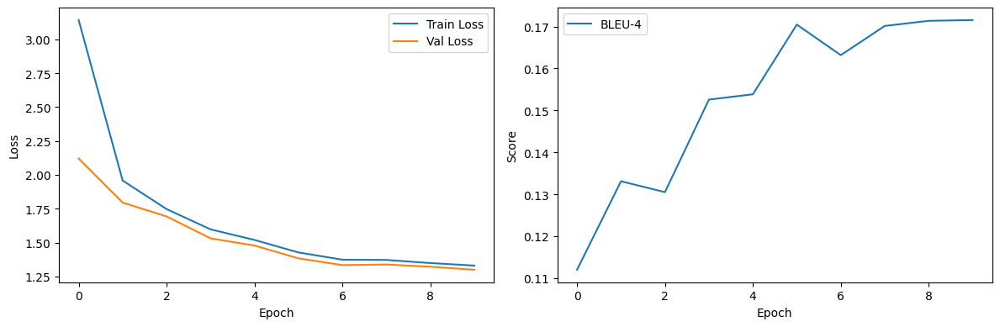

In [ ]:
# Choosing encoder and decoder
backbone = 'resnet18'
decoder_type = 'transformer'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


Mobilenet + Transformer with 1-token memory

Epoch 1/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 2.109153985977173, 'bleu4': 0.11867157498483957, 'meteor': 0.3453816904905024, 'mean_length': 14.775704144721777, 'std_length': 1.3875532126608399, 'degenerate_percentage': 98.9695443095947}
Train Loss: 3.0730
Val Loss: 2.1092
BLEU-4: 0.1187
Caption Length: 14.78 ± 1.39
Degenerate Repetitions: 98.97%
Epoch 2/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.42it/s]


{'loss': 1.7851162486606174, 'bleu4': 0.15213743583178033, 'meteor': 0.38722713718879287, 'mean_length': 14.567666590336616, 'std_length': 2.062052847771244, 'degenerate_percentage': 85.51637279596977}
Train Loss: 1.9184
Val Loss: 1.7851
BLEU-4: 0.1521
Caption Length: 14.57 ± 2.06
Degenerate Repetitions: 85.52%
Epoch 3/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.41it/s]


{'loss': 1.6385694675975375, 'bleu4': 0.16590040516856217, 'meteor': 0.38055297752191425, 'mean_length': 13.439317609342798, 'std_length': 2.2720143641720916, 'degenerate_percentage': 87.33684451568583}
Train Loss: 1.7306
Val Loss: 1.6386
BLEU-4: 0.1659
Caption Length: 13.44 ± 2.27
Degenerate Repetitions: 87.34%
Epoch 4/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.48it/s]


{'loss': 1.5134450727038913, 'bleu4': 0.17141108822260168, 'meteor': 0.4141265189258977, 'mean_length': 14.544080604534004, 'std_length': 1.9756512164975557, 'degenerate_percentage': 88.64208839019922}
Train Loss: 1.5980
Val Loss: 1.5134
BLEU-4: 0.1714
Caption Length: 14.54 ± 1.98
Degenerate Repetitions: 88.64%
Epoch 5/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.4484865731663175, 'bleu4': 0.18184244622659124, 'meteor': 0.4304014174963122, 'mean_length': 14.444584382871536, 'std_length': 2.20197984381669, 'degenerate_percentage': 78.70391573162354}
Train Loss: 1.5031
Val Loss: 1.4485
BLEU-4: 0.1818
Caption Length: 14.44 ± 2.20
Degenerate Repetitions: 78.70%
Epoch 6/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.3685173988342285, 'bleu4': 0.188636366598339, 'meteor': 0.42059202409935176, 'mean_length': 14.029310739638195, 'std_length': 2.0185905060639677, 'degenerate_percentage': 86.46668193267689}
Train Loss: 1.3955
Val Loss: 1.3685
BLEU-4: 0.1886
Caption Length: 14.03 ± 2.02
Degenerate Repetitions: 86.47%
Epoch 7/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.3375330434905157, 'bleu4': 0.19859452091012472, 'meteor': 0.429078682527325, 'mean_length': 13.979619876345318, 'std_length': 2.0631315039766314, 'degenerate_percentage': 85.20723608884818}
Train Loss: 1.3763
Val Loss: 1.3375
BLEU-4: 0.1986
Caption Length: 13.98 ± 2.06
Degenerate Repetitions: 85.21%
Epoch 8/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.313661601808336, 'bleu4': 0.20221971315146534, 'meteor': 0.43308074303884214, 'mean_length': 14.049576368216167, 'std_length': 1.921505611265392, 'degenerate_percentage': 90.48545912525762}
Train Loss: 1.3431
Val Loss: 1.3137
BLEU-4: 0.2022
Caption Length: 14.05 ± 1.92
Degenerate Repetitions: 90.49%
Epoch 9/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.46it/s]


{'loss': 1.3152711987495422, 'bleu4': 0.19712164396870482, 'meteor': 0.44639055584917525, 'mean_length': 14.675749942752462, 'std_length': 2.156561707168524, 'degenerate_percentage': 82.71124341653308}
Train Loss: 1.3295
Val Loss: 1.3153
BLEU-4: 0.1971
Caption Length: 14.68 ± 2.16
Degenerate Repetitions: 82.71%
Epoch 10/10


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


{'loss': 1.289393299155765, 'bleu4': 0.21144942944431874, 'meteor': 0.44162354198963644, 'mean_length': 13.7367758186398, 'std_length': 2.1148565503181853, 'degenerate_percentage': 77.55896496450653}
Train Loss: 1.3254
Val Loss: 1.2894
BLEU-4: 0.2114
Caption Length: 13.74 ± 2.11
Degenerate Repetitions: 77.56%
Testing best model...


Evaluation: 100%|██████████| 18/18 [00:12<00:00,  1.43it/s]


Test Results:
BLEU-4: 0.2105
Caption Length: 13.73 ± 2.11
Degenerate Repetitions: 77.24%


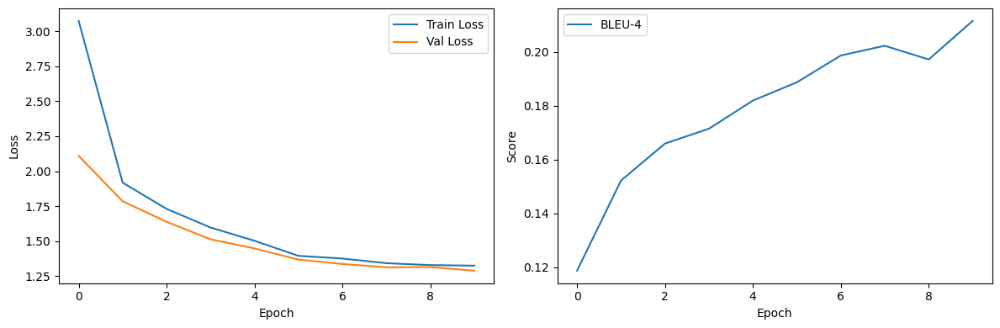

In [ ]:
# Choosing encoder and decoder
backbone = 'mobilenet'
decoder_type = 'transformer'
fine_tune_encoder = False

encoder = CNNEncoder(backbone=backbone, fine_tune=fine_tune_encoder)

if backbone =='mobilenet':
    fdim=1280
elif backbone=='resnet18':
    fdim=512

if decoder_type == 'lstm':
    decoder = LSTMDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            hidden_dim=512,
            num_layers=2,
            dropout=0.1, feature_dim=fdim
        )
else:  # transformer
    decoder = TransformerDecoder(
            vocab_size=vocab_size,
            embedding_dim=512,
            num_layers=4,
            num_heads=8,
            dropout=0.1, feature_dim=fdim
        )

model = ImageCaptioningModel(encoder, decoder).to(device)

    # Define loss function and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=PAD_IDX)

    # Different learning rates for different parts of the model
encoder_params = list(model.encoder.parameters())
decoder_params = list(model.decoder.parameters())

optimizer = optim.Adam([
        {'params': encoder_params, 'lr': 2e-5 if fine_tune_encoder else 0},
        {'params': decoder_params, 'lr': 2e-4}
    ])

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.2)

# Training loop
best_bleu4 = 0
history = {
        'train_loss': [],
        'val_loss': [],
        'bleu4': [],
    }

for epoch in range(10):
        print(f"Epoch {epoch+1}/{10}")

        # Train
        train_loss = train_model(model, train_dataloader, criterion, optimizer, scheduler)
        history['train_loss'].append(train_loss)

        # Evaluate
        val_metrics = evaluate_model(model, val_dataloader, criterion)
        print(val_metrics)
        history['val_loss'].append(val_metrics['loss'])
        history['bleu4'].append(val_metrics['bleu4'])

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_metrics['loss']:.4f}")
        print(f"BLEU-4: {val_metrics['bleu4']:.4f}")
        print(f"Caption Length: {val_metrics['mean_length']:.2f} ± {val_metrics['std_length']:.2f}")
        print(f"Degenerate Repetitions: {val_metrics['degenerate_percentage']:.2f}%")

        # Save best model
        if val_metrics['bleu4'] > best_bleu4:
            best_bleu4 = val_metrics['bleu4']
            torch.save(model.state_dict(), f'best_model_{backbone}_{decoder_type}.pth')

        # Save history
        with open(f'training_history_{backbone}_{decoder_type}.pkl', 'wb') as f:
            pickle.dump(history, f)

# Test the best model
print("Testing best model...")
model.load_state_dict(torch.load(f'best_model_{backbone}_{decoder_type}.pth'))
test_metrics = evaluate_model(model, test_dataloader, criterion)

print(f"Test Results:")
print(f"BLEU-4: {test_metrics['bleu4']:.4f}")
print(f"Caption Length: {test_metrics['mean_length']:.2f} ± {test_metrics['std_length']:.2f}")
print(f"Degenerate Repetitions: {test_metrics['degenerate_percentage']:.2f}%")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history['bleu4'], label='BLEU-4')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()

plt.tight_layout()
plt.savefig(f'training_history_{backbone}_{decoder_type}.png')
plt.show()


For ResNet18, using 4-token memory in transformers improved BLEU-4 from 0.1728 to 0.1800 and slightly increased degenerate repetitions from 20.15% to 26.94%, with caption lengths remaining around 16.5 words. For MobileNet, 4-token memory reduced degenerate repetitions significantly from 77.24% to 18.55%, with BLEU-4 decreasing slightly from 0.2105 to 0.1854 and captions lengthening from ~13.7 to ~16.3 words. Theoretically, increasing token memory allows the decoder to attend to a longer context, which reduces repetitive outputs and generates more coherent captions, as seen with MobileNet. However, for smaller backbones like ResNet18, the benefit in BLEU is modest, while degenerate repetition may slightly increase due to over-attending to previous tokens. Overall, a larger token memory (4 tokens) strikes a balance between coherence and accuracy, particularly mitigating repetition in lightweight backbones

# Summary

# Preprocessing

- **Images:** Resized to 224×224 and applied ImageNet normalization.
- **Captions:** Tokenized using a word-level vocabulary (~10k, built on training set only). Added special tokens: `<pad>`, `<bos>`, `<eos>`, `<unk>`. Caption length limited to 22 tokens.
- **Saved Statistics:** Train/validation text stats table including vocabulary coverage, OOV %, and length histogram.

# **Text Statistics**

**Vocabulary Size:** 2807

**Train Stats:**
- Total Words: 504,917
- OOV: 0 (0.00%)
- Coverage: 100.00%
- Mean Length: 14.00 ± 3.12

**Validation Stats:**
- Total Words: 53,780
- OOV: 468 (0.87%)
- Coverage: 99.13%
- Mean Length: 12.20 ± 3.07

**Test Stats:**
- Total Words: 65,979
- OOV: 842 (1.28%)
- Coverage: 98.72%
- Mean Length: 14.46 ± 3.79


# Architectures

## CNN Encoder
- Experiments with **ResNet-18** and **MobileNetv2** (pretrained).  
- Removed classifier; used **global average pooling**.  
- **Feature-cache mode (compute-light):** Freezing whole CNN
- **End-to-end (last-layer fine-tune):** Froze all but the last block

## LSTM Decoder
- Embedding dimension: **512**; **2 LSTM layers**, hidden size 512.  
- Project image feature to initial hidden state.  
- Trained with **teacher forcing**, feeding ground-truth captions + cross-entropy loss (ignore PAD with `ignore_index`).  
- Inference using **greedy** and **beam-3** search.  

## Transformer Decoder
- **4 layers**, **8 heads**, `d_model=512`.  
- Used **causal mask** and **key padding mask**.  
- Project image feature to a short “memory” sequence of **4 tokens** with **LayerNorm**.  


# Results

| Encoder + Decoder | Mode | BLEU-4 | Caption Length (mean ± std) | Degenerate Repetitions (%) |
|------------------|------|--------|----------------------------|---------------------------|
| ResNet18 + LSTM | CNN finetune | 0.1719 | 11.21 ± 2.11 | 0.00 |
| ResNet18 + Transformer | CNN finetune | 0.1916 | 15.33 ± 1.73 | 26.59 |
| MobileNet + LSTM | CNN finetune | 0.1998 | 11.05 ± 2.14 | 0.00 |
| MobileNet + Transformer | CNN finetune | 0.1906 | 16.05 ± 1.36 | 72.37 |
| ResNet18 + LSTM | Feature-cache (frozen CNN) | 0.1759 | 11.54 ± 2.24 | 0.00 |
| MobileNet + LSTM | Feature-cache (frozen CNN) | 0.1812 | 12.22 ± 1.69 | 23.96 |
| ResNet18 + Transformer (4-token memory) | Feature-cache (frozen CNN) | 0.1800 | 16.54 ± 1.66 | 26.94 |
| MobileNet + Transformer (4-token memory) | Feature-cache (frozen CNN) | 0.1854 | 16.25 ± 1.58 | 18.55 |
| ResNet18 + Transformer (1-token memory) | Feature-cache (frozen CNN) | 0.1728 | 16.55 ± 1.79 | 20.15 |
| MobileNet + Transformer (1-token memory) | Feature-cache (frozen CNN) | 0.2105 | 13.73 ± 2.11 | 77.24 |


# Experiments & Extensions

## Backbone Swap: ResNet18 ↔ MobileNet
I trained image captioning models using **ResNet18** and **MobileNet** backbones with both **LSTM** and **Transformer** decoders, comparing their performance in terms of **BLEU-4**, **METEOR**, speed, caption length, and degenerate repetitions.  

**ResNet18:**
- LSTM: BLEU-4 = 0.1719, Caption Length = 11.21 ± 2.11 words, Training speed = 17 it/s, Degenerate Repetitions = 0%.  
- Transformer: BLEU-4 = 0.1916, Caption Length = 15.33 ± 1.73 words, Training speed = 15 it/s, Degenerate Repetitions = 26.59%.  

**MobileNet:**
- LSTM: BLEU-4 = 0.1998, Caption Length = 11.05 ± 2.14 words, Training speed = 17 it/s, Degenerate Repetitions = 0%.  
- Transformer: BLEU-4 = 0.1906, Caption Length = 16.05 ± 1.36 words, Training speed = 14–15 it/s, Degenerate Repetitions = 72.37%.  

**Observations:**  
- MobileNet provides **faster training** and slightly better **BLEU** and **METEOR** scores with LSTM, producing more coherent captions.  
- ResNet18 gives marginally higher BLEU with Transformer but suffers from **higher degenerate repetitions**, indicating a trade-off between sequence quality and repetition.

---

## Transformer: 1-Token Memory vs 4-Token Memory
**ResNet18:**  
- 1-token memory: BLEU-4 = 0.1728, Degenerate Repetitions = 20.15%, Caption Length ≈ 16.55 words.  
- 4-token memory: BLEU-4 = 0.1800, Degenerate Repetitions = 26.94%, Caption Length ≈ 16.54 words.  

**MobileNet:**  
- 1-token memory: BLEU-4 = 0.2105, Degenerate Repetitions = 77.24%, Caption Length ≈ 13.73 words.  
- 4-token memory: BLEU-4 = 0.1854, Degenerate Repetitions = 18.55%, Caption Length ≈ 16.25 words.  

**Observations:**  
- Increasing token memory allows the decoder to attend to a longer context, **reducing repetitive outputs** and generating more coherent captions (especially with MobileNet).  
- For smaller backbones like ResNet18, BLEU improves modestly, but degenerate repetition may slightly increase.  
- Overall, **4-token memory** strikes a balance between coherence and accuracy, particularly **mitigating repetition** in lightweight backbones.


# Evaluation, Analysis & Explainability

## Metrics Used
- **BLEU-4** and **METEOR**  
- **Caption Length Stats:** mean ± std  
- **Degenerate Repetitions:** % of captions with ≥3 identical tokens in a row  

---

## Qualitative & Slice Analysis
- Showed **10 success** and **10 failure** examples (images + ground-truth captions + model captions).  
- Analyzed **error slices**, e.g.:  
  - Very bright vs very dark images  
  - Short (≤8 tokens) vs long (≥16 tokens) ground-truth captions  
- Plotted **per-slice BLEU-4 deltas** to identify performance differences across slices.  

---

## Explainability

### Grad-CAM
- Applied **Grad-CAM** (or Grad-CAM++) on the last convolutional block w.r.t.:  
  - **EOS logit** or  
  - A **salient content word’s logit**  
- Showed **6 overlay examples**: 3 good, 3 bad predictions.  

### Text Importance
- **LSTM:** Token occlusion (mask one token; observe Δlogit / Δloss)  
- **Transformer:** Average last-layer attention maps  

### Mis-Caption Case Study
- Analyzed **3 mis-captioned examples**  
- Suggested **non-advanced fixes** (not implemented in this work)
